# Project Description

Capstone Project IBDM Dataset

This capstone is divided into a 4-phase duration. In this document, the entire details of the 4-phase(weekly) duration are given.

Phase 3

1. Now make only 1 data frame of two CSV files using the join operation of pandas and start doing EDA.

2. Do the complete EDA in detail to explore the insights of data and write detailed observations of each analysis.

Phase 4

1. Write the complete Machine learning code to make predictions of votes and gross collection. Use appropriate models on their label basis. Remember you need to make 2 different predictions: vote and gross collection.

2. Apply all the best techniques of scaling, and hyperparameter tuning, and avoid underfitting or overfitting (bias/variance)

3. At the end save the best model and convey on which basis you have chosen that model.

### Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression,LinearRegression,Lasso,Ridge
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler,PowerTransformer,MinMaxScaler,PolynomialFeatures
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,accuracy_score
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

### Create UDFs

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

### Import Data

In [3]:
# load the first csv file 
df1 = pd.read_csv(r'C:\Users\hp\Desktop\DataTrained\Capston Project\movie_1.csv')
print(df1.head())

# load the second csv file
df2=pd.read_csv(r'C:\Users\hp\Desktop\DataTrained\Capston Project\movie_2.csv')
print(df2.head())

   Serial no                                         Movie Name  \
0          1                                    The Dark Knight   
1          2      The Lord of the Rings: The Return of the King   
2          3                                          Inception   
3          4  The Lord of the Rings: The Fellowship of the Ring   
4          5              The Lord of the Rings: The Two Towers   

          Director_1 Director_2 Director_3  Duration  Year  Ratings  Metascore  
0  Christopher Nolan        NaN        NaN       152  2008      9.0       84.0  
1      Peter Jackson        NaN        NaN       201  2003      9.0       94.0  
2  Christopher Nolan        NaN        NaN       148  2010      8.8       74.0  
3      Peter Jackson        NaN        NaN       178  2001      8.8       92.0  
4      Peter Jackson        NaN        NaN       179  2002      8.8       87.0  
   Popularity                               Movie_Name       Stars_1  \
0           1                          

In [4]:
# Merge the 2 files to one dataset csv file.
df=pd.merge(df1,df2,how='inner',left_on='Movie Name',right_on='Movie_Name')
#Drop the duplicated column
df.drop('Movie_Name',axis=1,inplace=True)
pd. set_option('display.max_columns', 700)
pd.set_option('display.width', 100)
df

,Serial no,Movie Name,Director_1,Director_2,Director_3,Duration,Year,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification
0,1,The Dark Knight,Christopher Nolan,NaN,NaN,152,2008,9.0,84.0,35,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2718780,Action,Crime,Drama,534.86,PG-13
1,2,The Lord of the Rings: The Return of the King,Peter Jackson,NaN,NaN,201,2003,9.0,94.0,125,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1887419,Action,Adventure,Drama,377.85,PG-13
2,3,Inception,Christopher Nolan,NaN,NaN,148,2010,8.8,74.0,30,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,2413483,Action,Adventure,Sci-Fi,292.58,PG-13
3,4,The Lord of the Rings: The Fellowship of the Ring,Peter Jackson,NaN,NaN,178,2001,8.8,92.0,57,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,1916063,Action,Adventure,Drama,315.54,PG-13
4,5,The Lord of the Rings: The Two Towers,Peter Jackson,NaN,NaN,179,2002,8.8,87.0,225,Elijah Wood,Ian McKellen,Viggo Mortensen,Orlando Bloom,1703586,Action,Adventure,Drama,342.55,PG-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1478,1744,House of the Dead,Uwe Boll,NaN,NaN,90,2003,2.1,15.0,1343,Jonathan Cherry,Tyron Leitso,Clint Howard,Ona Grauer,37983,Action,Adventure,Horror,10.25,R
1479,1745,Radhe,Prabhu Deva,NaN,NaN,109,2021,1.9,NaN,1701,Salman Khan,Disha Patani,Randeep Hooda,Jackie Shroff,178807,Action,Crime,Thriller,NaN,TV-MA
1480,1746,Race 3,Remo D'Souza,NaN,NaN,160,2018,1.9,NaN,1702,Anil Kapoor,Salman Khan,Bobby Deol,Jacqueline Fernandez,47587,Action,Crime,Thriller,1.69,Not Rated
1481,1747,Angels Apocalypse,Sean Cain,Enzo Zelocchi,NaN,85,2015,1.7,NaN,1747,Enzo Zelocchi,Jana Rochelle,Ryan C.F. Buckley,William Kirkham,42911,Action,Fantasy,Sci-Fi,NaN,NaN


### Data Inspection

In [5]:
# Shape of the dataset
df.shape

(1483, 20)

Observations:

The Dataset contain 1484 rows and 20 columns.

In [6]:
# check dulpicated records
df.duplicated().sum()

0

In [7]:
# Let check if any whitespace, 'NA' or '-' exist in dataset.
df.isin([' ','NA','-']).sum().any()

False

Observations:

There are no duplicated data.

In [8]:
# Dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1483 entries, 0 to 1482
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Serial no            1483 non-null   int64  
 1   Movie Name           1483 non-null   object 
 2   Director_1           1483 non-null   object 
 3   Director_2           84 non-null     object 
 4   Director_3           4 non-null      object 
 5   Duration             1483 non-null   int64  
 6   Year                 1483 non-null   object 
 7   Ratings              1483 non-null   float64
 8   Metascore            1350 non-null   float64
 9   Popularity           1483 non-null   int64  
 10  Stars_1              1483 non-null   object 
 11  Stars_2              1482 non-null   object 
 12  Stars_3              1482 non-null   object 
 13  Stars_4              1482 non-null   object 
 14  Votes                1483 non-null   int64  
 15  Genre_1              1483 non-null   o

Observations:

We have 3 float type, 5 Int Type and 12 Object datatype.

In [9]:
df.Year.max()

'2023'

In [10]:
# Remove Serial no column for high cardinality
df.drop('Serial no',axis=1,inplace=True)

In [11]:
# Show the columns
df.columns

Index(['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Duration', 'Year', 'Ratings',
       'Metascore', 'Popularity', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Votes', 'Genre_1',
       'Genre_2', 'Genre_3', 'Gross_Collection_$M', 'Certification'],
      dtype='object')

In [12]:
# Check null values in  data
df.isnull().sum()

Movie Name                0
Director_1                0
Director_2             1399
Director_3             1479
Duration                  0
Year                      0
Ratings                   0
Metascore               133
Popularity                0
Stars_1                   0
Stars_2                   1
Stars_3                   1
Stars_4                   1
Votes                     0
Genre_1                   0
Genre_2                   2
Genre_3                 119
Gross_Collection_$M     202
Certification             4
dtype: int64

Observations:

These following features: (Director_2,Director_3,Metascore,Genre_2,Genre_3,Gross,Certification,Popularity) have NULL values.

In [13]:
# Value counts for every feature to check the missing again or unique values
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

Hellboy                      2
Conan the Barbarian          2
RoboCop                      2
Tron                         2
The Magnificent Seven        2
                            ..
Kisi Ka Bhai Kisi Ki Jaan    1
The Maze Runner              1
The Book of Eli              1
Aquaman                      1
Sadak 2                      1
Name: Movie Name, Length: 1454, dtype: int64
**********************************
Michael Bay         15
Tony S              13
Steven Spielberg    12
Antoine Fuqua       11
Roland Emmerich     11
                    ..
John Dahl            1
Tony Gilroy          1
Andrea Di Stefan     1
Chris Wedg           1
Mahesh Bha           1
Name: Director_1, Length: 798, dtype: int64
**********************************
Lilly Wachowski       5
Joe Russo             5
Brian Taylor          4
Christopher Miller    3
Espen Sandberg        3
                     ..
Anouk Whissell        1
Michael Crichton      1
Peter Ramsey          1
Sam Fell              1
Enzo Ze

Description for Certificate: 

MPAA (Motion Picture Association of America) Ratings (United States):
G: General Audiences PG: Parental Guidance Suggested PG-13: Parents Strongly Cautioned R: Restricted (Requires accompanying parent or adult guardian for viewers under 17) NC-17: No One 17 and Under Admitted

In [14]:
# Modify the Certification values
# Define the list for replacement
replace_list_18= ['18+', '18 +', '18TC']
replacement_value_18= '18'
replace_list_17= ['17+', 'NC-17']
replacement_value_17= '17'
replace_list_16= ['16+', '16 +']
replacement_value_16= '16'
replace_list_15= ['PG 15', 'PG-15']
replacement_value_15= '15'
replace_list_13= ['13+', '13 +','M','M/PG']
replacement_value_13= '13'
replace_list_12= ['12+', 'R-12']
replacement_value_12= '12'

In [15]:
# Replace multiple values using the list
df['Certification'] = df.Certification.replace(replace_list_18, replacement_value_18)
df['Certification'] = df.Certification.replace(replace_list_17, replacement_value_17)
df['Certification'] = df.Certification.replace(replace_list_16, replacement_value_16)
df['Certification'] = df.Certification.replace(replace_list_15, replacement_value_15)
df['Certification'] = df.Certification.replace(replace_list_13, replacement_value_13)
df['Certification'] = df.Certification.replace(replace_list_12, replacement_value_12)
df['Certification'] =df.Certification.replace('(Banned)','R')
df['Certification'] =df.Certification.replace('8+','8').replace('7+','7')

In [16]:
# Check the Certification feature again
df.Certification.value_counts()

R            596
PG-13        561
PG           178
Not Rated     75
TV-MA         27
UA            14
G             10
TV-14          6
Approved       4
13             3
U              2
Passed         2
16             1
Name: Certification, dtype: int64

In [17]:
# Handling Missing values in dataset.
df['Certification'] =df.Certification.replace(np.nan,'Not Rated')
df.Popularity.fillna(0.0,inplace=True)
df.Director_2.fillna('NA',inplace=True)
df.Director_3.fillna('NA',inplace=True)
df.Stars_2.fillna('NA',inplace=True)
df.Stars_3.fillna('NA',inplace=True)
df.Stars_4.fillna('NA',inplace=True)
df.Genre_2.fillna('NA',inplace=True)
df.Genre_3.fillna('NA',inplace=True)

# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Use some features of the data
data=df[['Ratings','Votes','Metascore']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [18]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [19]:
df['Metascore']=unscaled_data[:,2]
df.Metascore

0       84.0
1       94.0
2       74.0
3       92.0
4       87.0
        ... 
1478    15.0
1479    19.2
1480    19.2
1481    19.2
1482    19.2
Name: Metascore, Length: 1483, dtype: float64

In [20]:
# Check the null values again
df.isnull().sum()

Movie Name               0
Director_1               0
Director_2               0
Director_3               0
Duration                 0
Year                     0
Ratings                  0
Metascore                0
Popularity               0
Stars_1                  0
Stars_2                  0
Stars_3                  0
Stars_4                  0
Votes                    0
Genre_1                  0
Genre_2                  0
Genre_3                  0
Gross_Collection_$M    202
Certification            0
dtype: int64

In [21]:
# Use later when predicting the gross feature as a target
df_gross=df.dropna()
df_gross.shape

(1281, 19)

In [22]:
# Using knn imputer for both metascore and gross
from sklearn.impute  import KNNImputer
imputer=KNNImputer(n_neighbors=5)
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Use some features of the data
data=df[['Ratings','Votes','Gross_Collection_$M']]
# Perform Min-Max Scaling
scaled_data = scaler.fit_transform(data)

# Fit the imputer on the data
imputer.fit(scaled_data)
# Replacing the missing values
data=imputer.transform(scaled_data)

In [23]:
# Reverse the scaling
unscaled_data = scaler.inverse_transform(data)

In [24]:
df['Gross_Collection_$M']=unscaled_data[:,2]
df.Metascore

0       84.0
1       94.0
2       74.0
3       92.0
4       87.0
        ... 
1478    15.0
1479    19.2
1480    19.2
1481    19.2
1482    19.2
Name: Metascore, Length: 1483, dtype: float64

# EDA

In [25]:
# split train data to continous and categorical varaiables.
num=df.select_dtypes(include=['float64','int64'])
cat=df.select_dtypes(include=['object'])

# split train data to continous and categorical varaiables.
num_gross=df_gross.select_dtypes(include=['float64','int64'])
cat_gross=df_gross.select_dtypes(include=['object'])

In [26]:
# Descriptive analysis for continous data
num.apply(continuous_var_summary)

,Duration,Ratings,Metascore,Popularity,Votes,Gross_Collection_$M
N,1483.000000,1483.000000,1483.000000,1.483000e+03,1.483000e+03,1483.000000
NMISS,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
SUM,170907.000000,9534.600000,78899.400000,1.245172e+06,2.843506e+08,111498.046000
MEAN,115.244100,6.429265,53.202562,8.396305e+02,1.917401e+05,75.184117
MEDIAN,111.000000,6.400000,52.000000,8.310000e+02,1.048030e+05,41.090000
STD,21.672318,0.989060,16.630762,4.969456e+02,2.463973e+05,101.042577
VAR,469.689363,0.978239,276.582261,2.469549e+05,6.071161e+10,10209.602303
MIN,45.000000,1.200000,9.000000,1.000000e+00,2.502800e+04,0.000000
P1,82.820000,3.346000,17.000000,1.782000e+01,2.575620e+04,0.030000
P5,88.000000,4.800000,27.000000,8.310000e+01,2.937020e+04,2.347000


In [27]:
# Descriptive analysis for categorical data
cat.describe(include='O')

,Movie Name,Director_1,Director_2,Director_3,Year,Stars_1,Stars_2,Stars_3,Stars_4,Genre_1,Genre_2,Genre_3,Certification
count,1483,1483,1483,1483,1483,1483,1483,1483,1483,1483,1483,1483,1483
unique,1454,798,68,5,72,612,979,1107,1212,2,16,19,13
top,Hellboy,Michael Bay,NA,NA,2016,Arnold Schwarzenegger,Samuel L. Jackson,Morgan Freeman,Jeffrey Wright,Action,Adventure,Thriller,R
freq,2,15,1399,1479,64,25,13,7,5,1432,559,264,596


### Univariate analysis

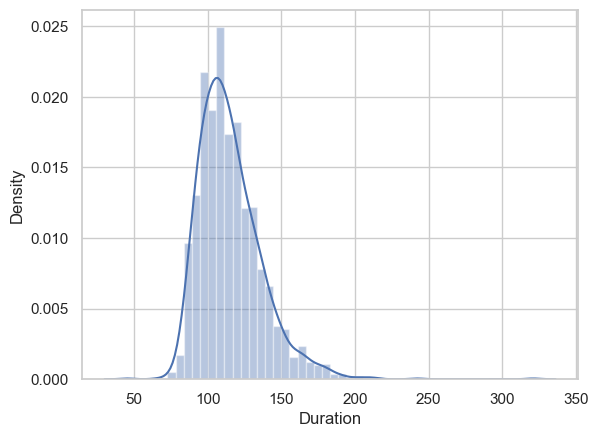

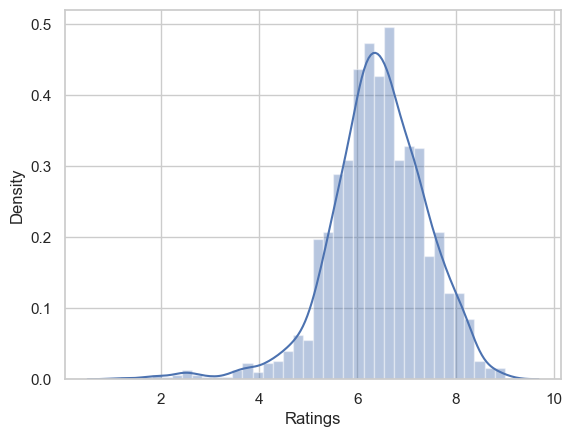

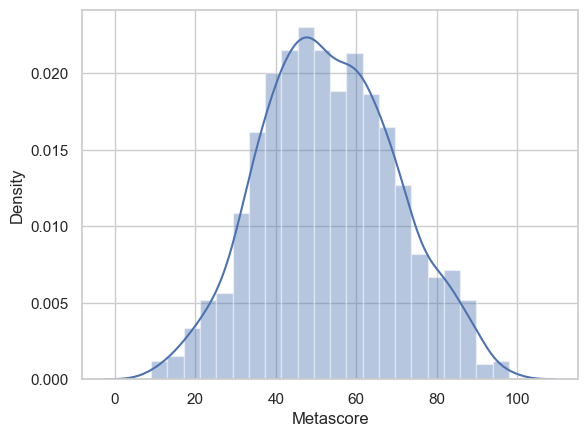

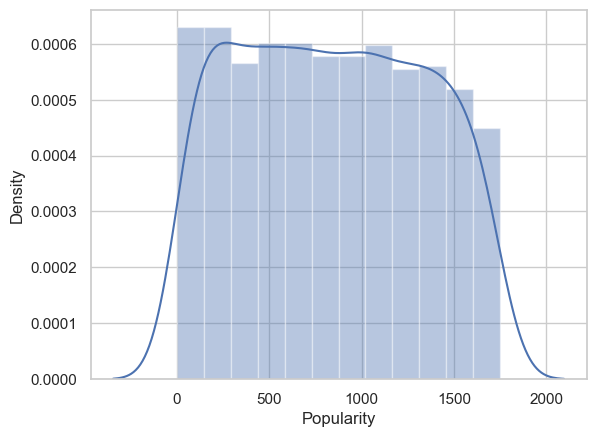

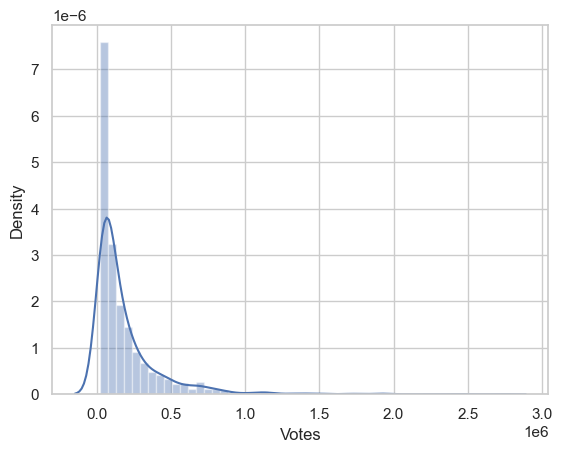

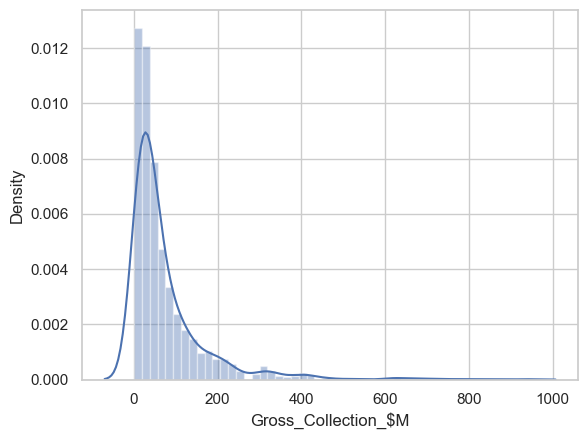

In [28]:
# Check Normality of continous data
for i in num.columns:
    sns.distplot(num[i])
    plt.show()

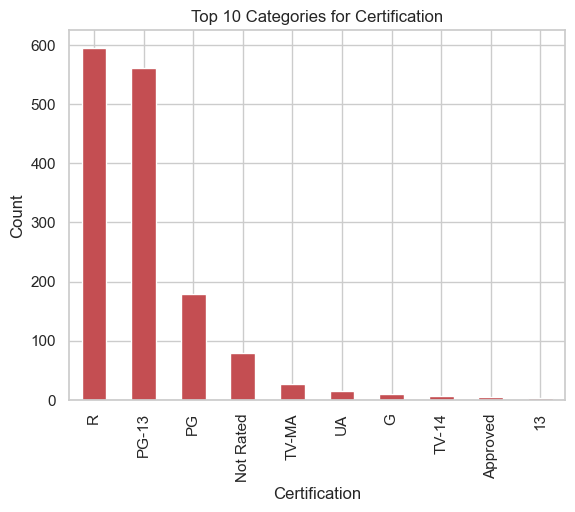

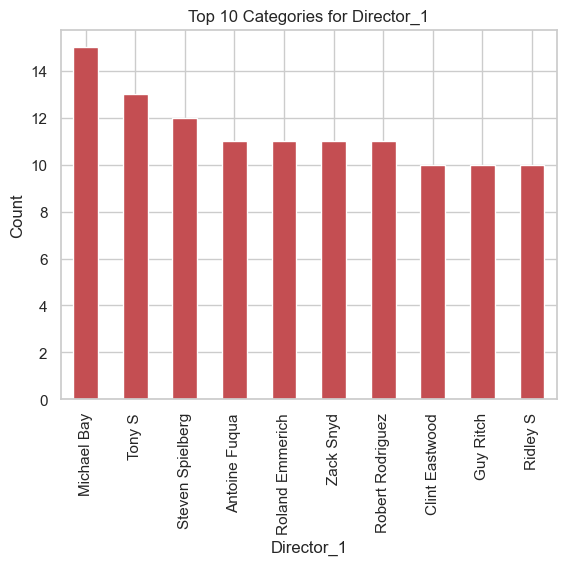

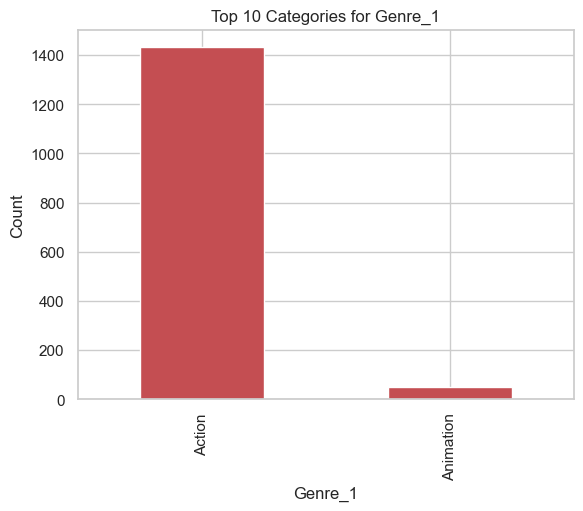

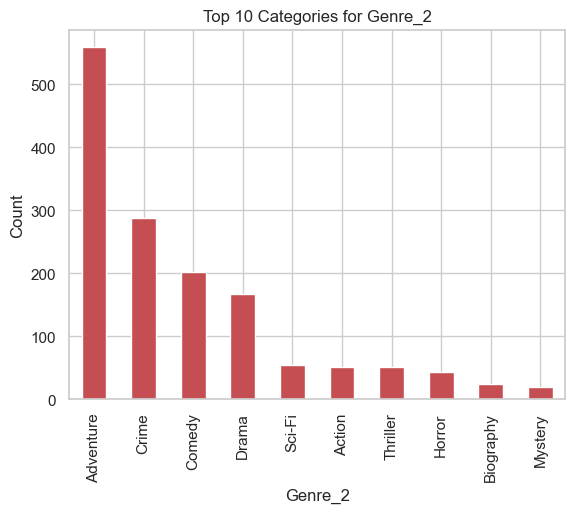

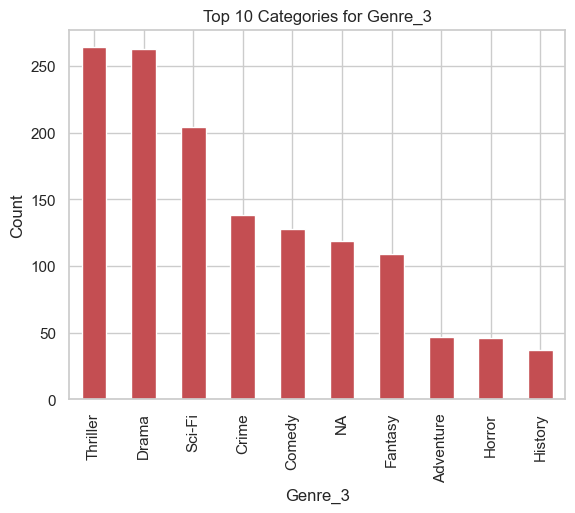

...

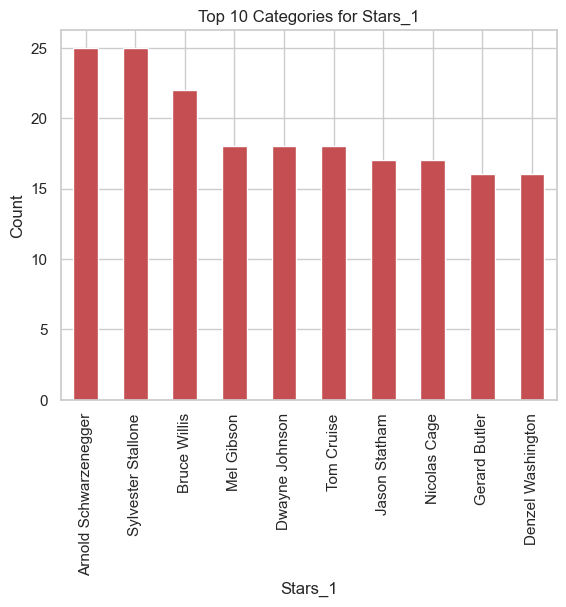

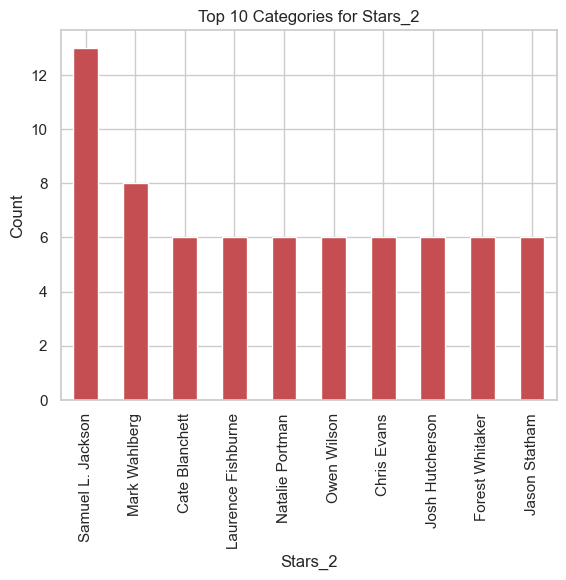

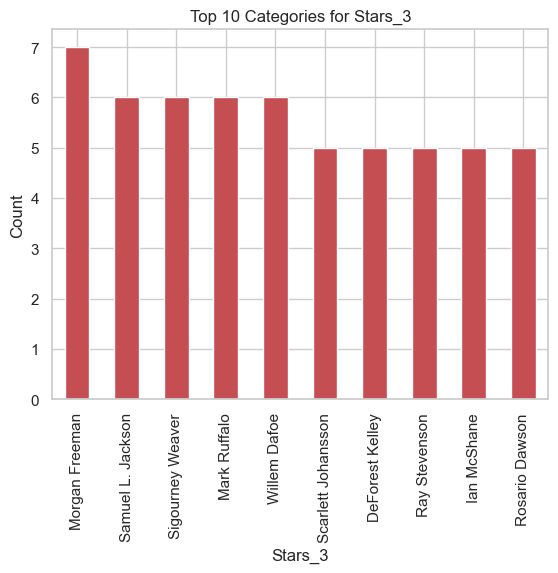

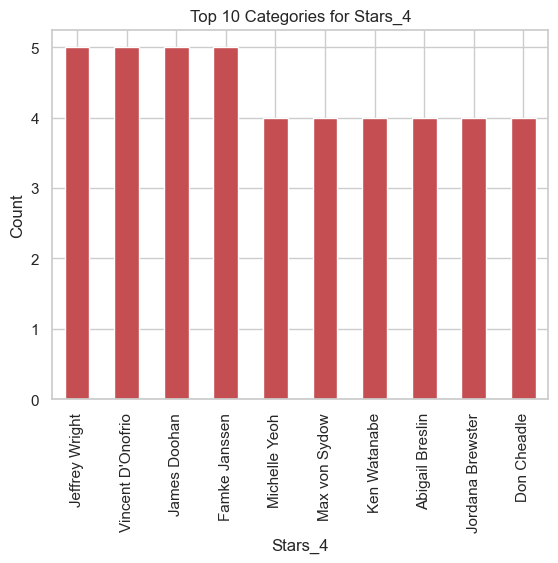

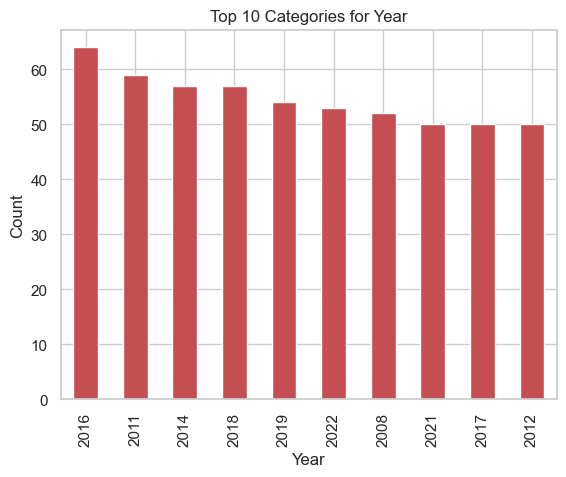

In [29]:
# Check count of categorical data for the best 7
for i in cat.columns.difference(['Director_2','Director_3']):
    cat[i].value_counts().sort_values(ascending=False).head(10).plot(kind='bar', color='r')
    plt.xlabel(i)
    plt.ylabel('Count')
    plt.title(f'Top 10 Categories for {i}')
    plt.show()

### Bivariate analysis

In [30]:
# top 20 rated movies according to  Popularity|User Rating|Number of Votes/Metascore/Runtime
for col in ['Popularity','Ratings','Votes','Metascore','Duration','Gross_Collection_$M']:
    top_rated= df.sort_values(by=col ,ascending=False).head(20)
    figure=px.bar(top_rated,x='Movie Name',y=col)
    figure.show()

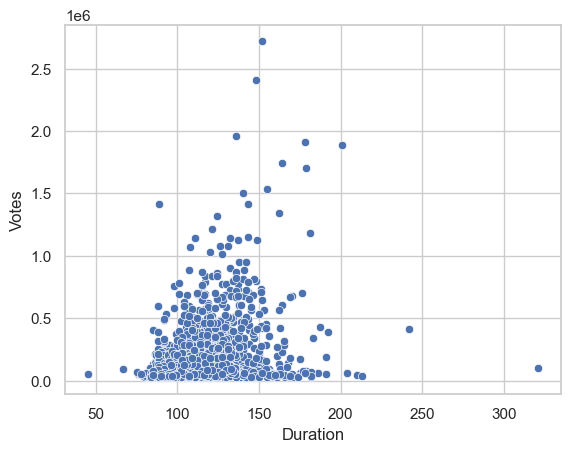

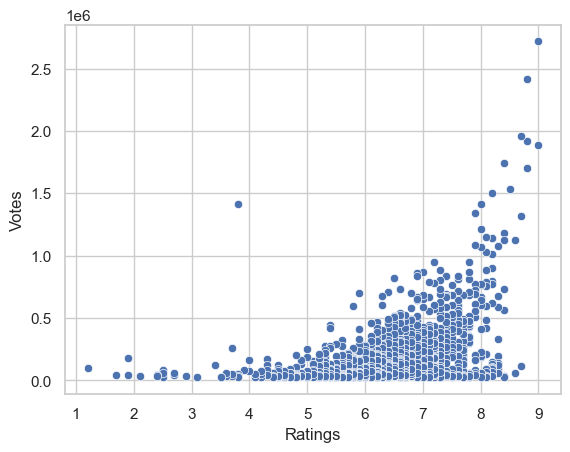

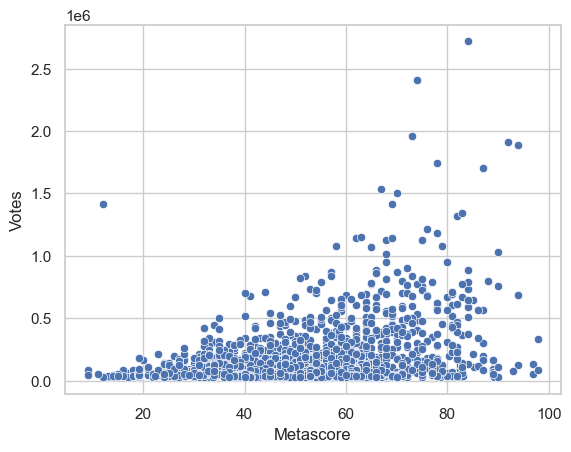

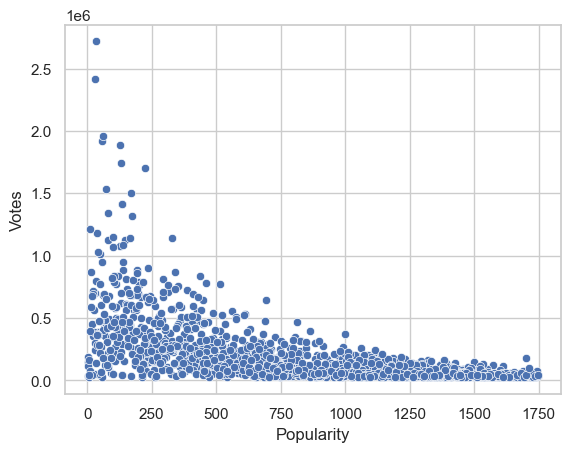

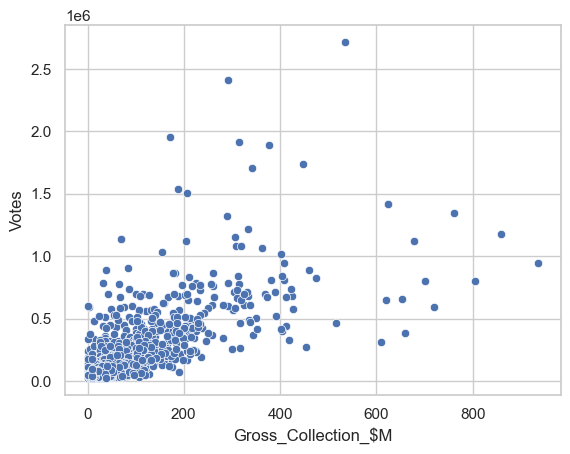

In [31]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.drop(['Votes']):
    sns.scatterplot(x=i, y='Votes', data=num)
    plt.show()

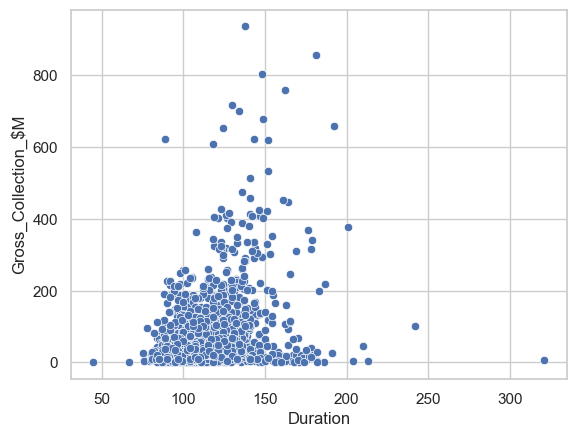

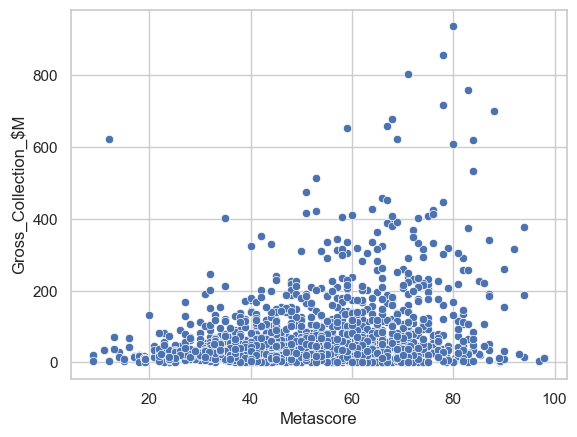

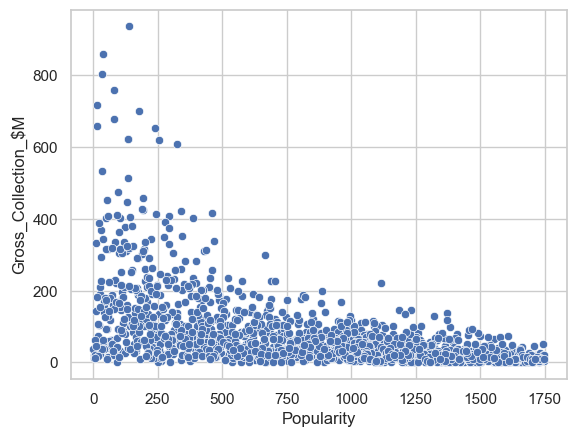

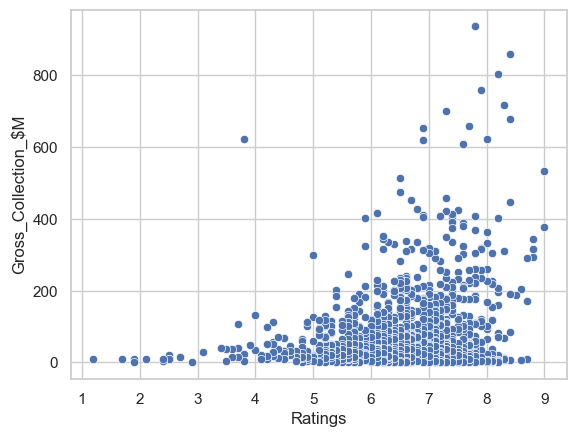

In [32]:
# Scatter plot between continous features and target variable (Votes) 
for i in num.columns.difference(['Votes','Gross_Collection_$M']):
    sns.scatterplot(x=i, y='Gross_Collection_$M', data=num)
    plt.show()

In [33]:
# Checking the relation between year and  Targets variables

# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Votes',width=1500, height=600)

# Display the plot
fig.show()


In [34]:
# Sort the DataFrame by the x-axis column in ascending order
df_sorted = df.sort_values(by='Year')

# Create the plotly bar plot
fig = px.line(df_sorted, x='Year', y='Gross_Collection_$M',width=1500, height=600)

# Display the plot
fig.show()

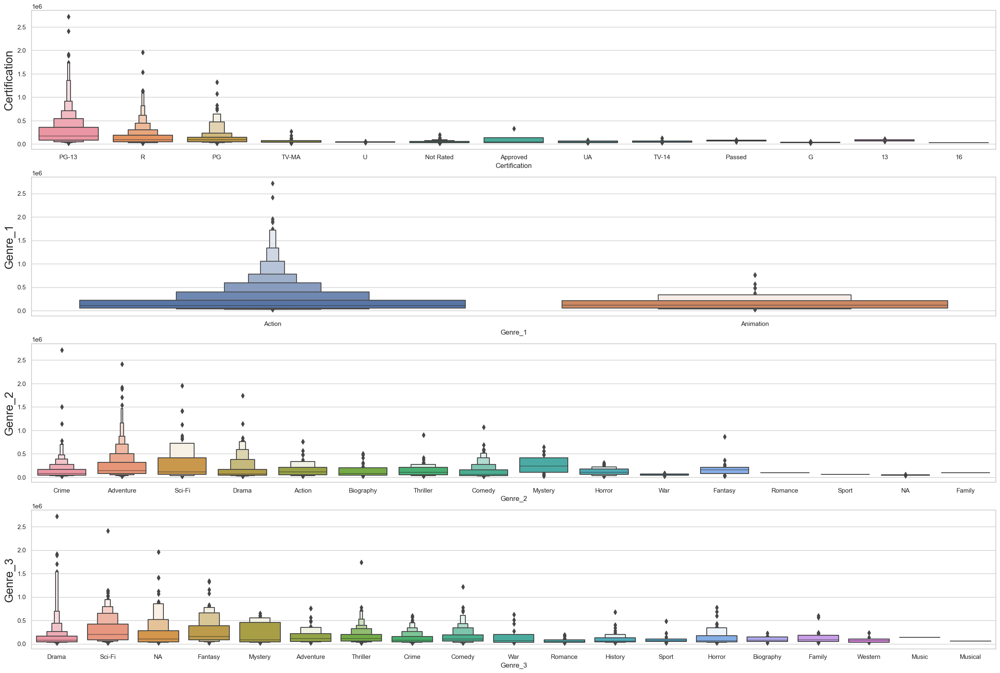

In [35]:
# Relationship between categorical columns and Target variable (Votes)

plt.figure(figsize=(30,20), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(4,1,plotnumber)
        sns.boxenplot(y=df.Votes,x=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()


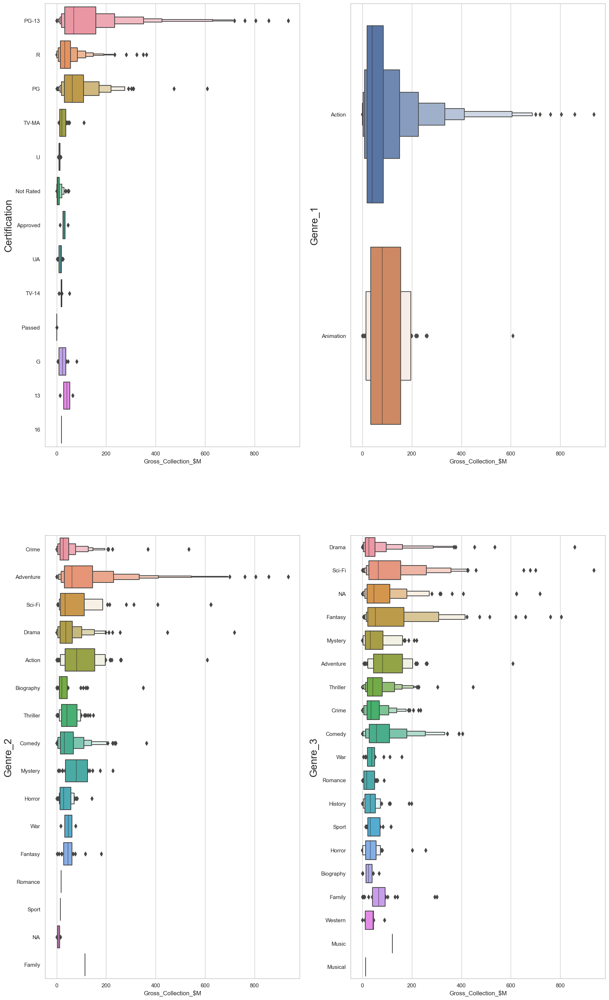

In [36]:
# Relationship between categorical columns and Target variable (Gross)

plt.figure(figsize=(20,35), facecolor='white')
plotnumber = 1

for i in ['Certification', 'Genre_1', 'Genre_2','Genre_3']:
    if plotnumber<=4 :
        ax = plt.subplot(2,2,plotnumber)
        sns.boxenplot(x=df['Gross_Collection_$M'],y=df[i])
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

### Multivariate analysis

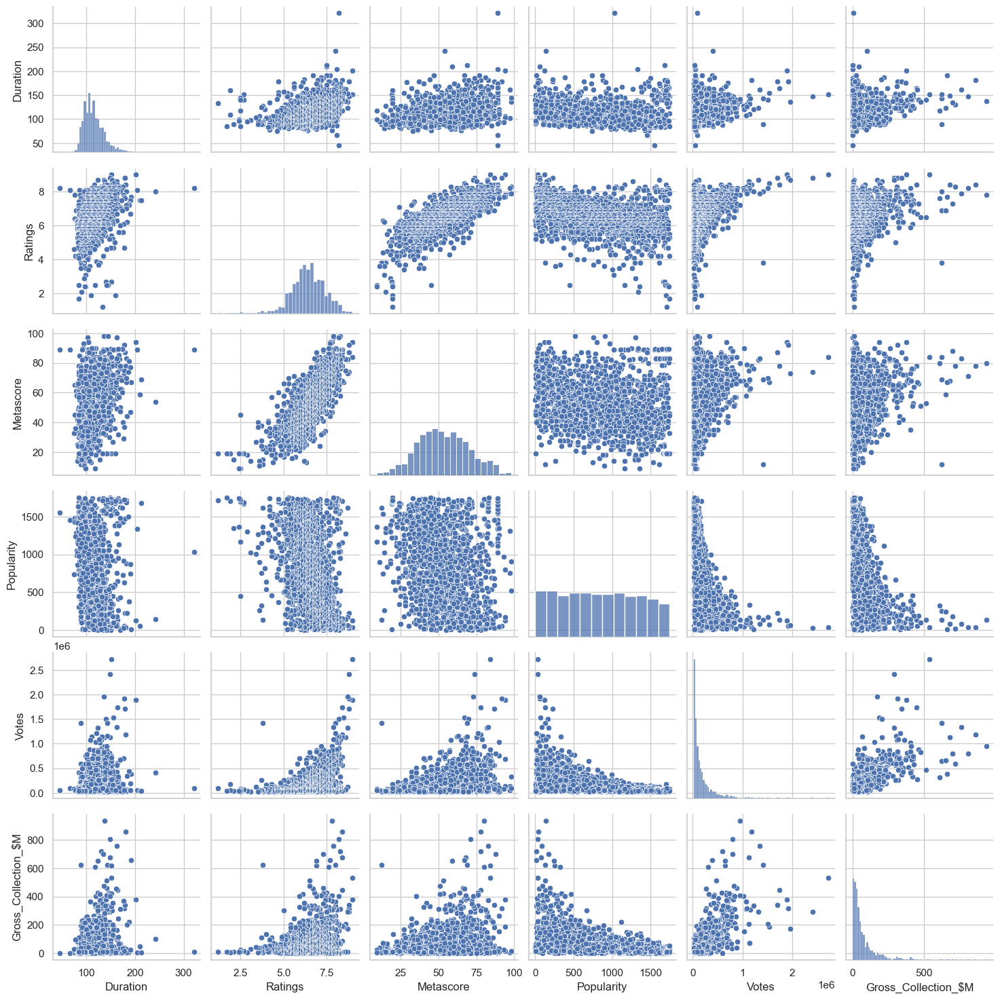

In [37]:
# Observe the Comparison between variables?

sns.pairplot(df)
plt.show()

Observations:

we will have two Dataframes one for predicting Votes and one for Gross_Collection_M.

### Feature Extraction

In [38]:
# Create new feature to show movies year released from 2023
df['Year'] = df['Year'].astype(int)
df['Year_from_2023']= 2023 - df['Year'] 

df_gross['Year'] = df_gross['Year'].astype(int)
df_gross['Year_from_2023']= 2023 - df_gross['Year'] 

In [39]:
# Drop year feature not needed anymore.
df.drop('Year', axis=1,inplace=True)
df_gross.drop('Year', axis=1,inplace=True)

In [40]:
df.columns

Index(['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Duration', 'Ratings', 'Metascore',
       'Popularity', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Votes', 'Genre_1', 'Genre_2',
       'Genre_3', 'Gross_Collection_$M', 'Certification', 'Year_from_2023'],
      dtype='object')

### Outliers treatment

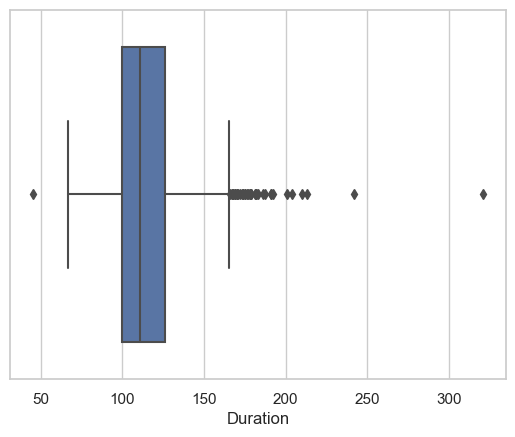

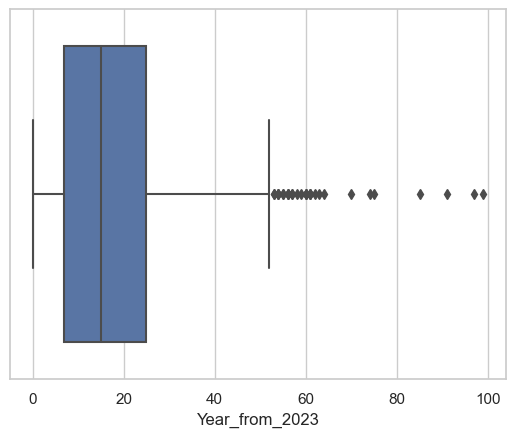

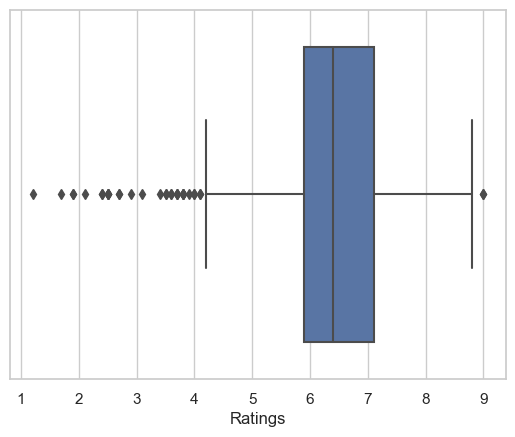

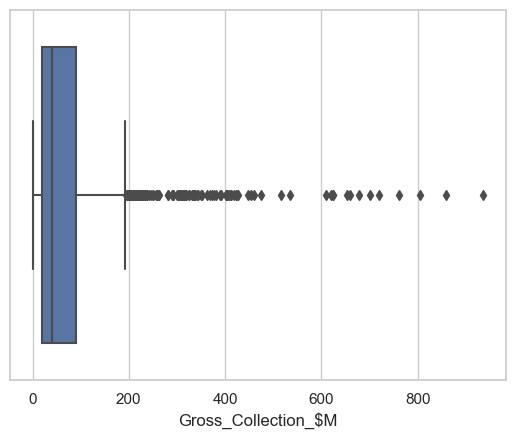

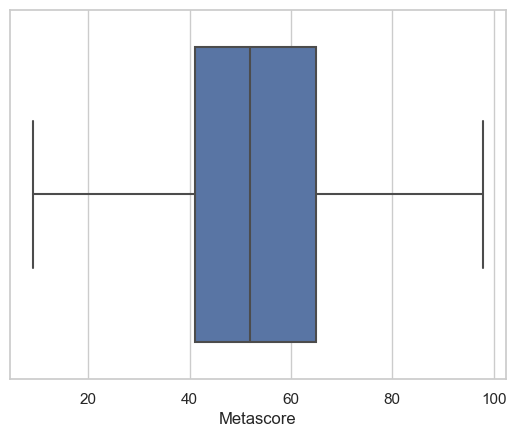

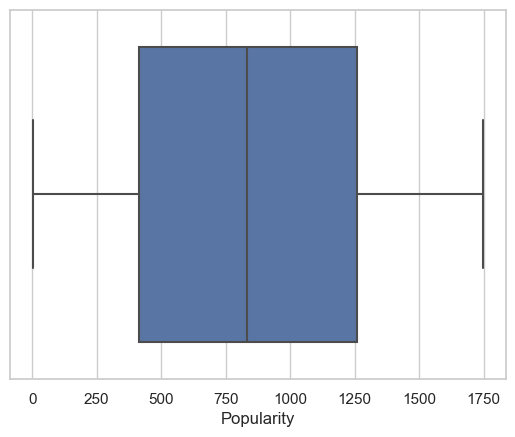

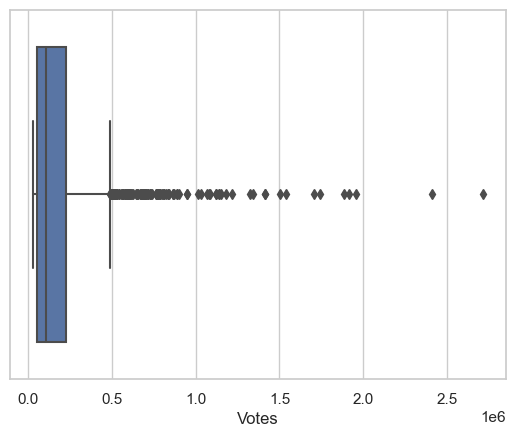

In [41]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.boxplot(df[col])
    plt.show()

In [42]:
# use Z-score method
outliers=df[['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']]
z=np.abs(zscore(outliers))
df_new=df[(z<3).all(axis=1)]
df_new

,Movie Name,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification,Year_from_2023
7,Soorarai Pottru,Sudha Kongara,NA,NA,153,8.7,82.6,1612,Suriya,Paresh Rawal,Aparna Balamurali,Urvashi,119509,Action,Drama,NA,9.502,TV-MA,3
9,Sita Ramam,Hanu Raghavapud,NA,NA,163,8.6,82.6,1272,Dulquer Salmaan,Mrunal Thakur,Rashmika Mandanna,Sumanth,59938,Action,Drama,Mystery,6.400,U,1
12,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,8.4,87.0,27,Shameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,566844,Animation,Action,Adventure,190.240,PG,5
15,Aliens,James Cameron,NA,NA,137,8.4,84.0,154,Sigourney Weaver,Michael Biehn,Carrie Henn,Paul Reiser,732615,Action,Adventure,Sci-Fi,85.160,R,37
16,Kaithi,Lokesh Kanagaraj,NA,NA,145,8.4,89.0,1159,Karthi,Narain,Arjun Das,George Maryan,36110,Action,Adventure,Crime,6.400,Not Rated,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,Superman IV: The Quest for Peace,Sidney J. Fu,NA,NA,90,3.7,24.0,1145,Christopher Reeve,Gene Hackman,Margot Kidder,Jackie Cooper,50631,Action,Adventure,Sci-Fi,15.680,PG,36
1464,Dungeons & Dragons,Courtney Solomon,NA,NA,107,3.6,14.0,265,Justin Whalin,Jeremy Irons,Zoe McLellan,Bruce Payne,35146,Action,Adventure,Fantasy,15.220,PG-13,23
1465,Mortal Kombat: Annihilation,John R. Leon,NA,NA,95,3.6,11.0,896,Robin Shou,Talisa Soto,James Remar,Sandra Hess,56377,Action,Adventure,Fantasy,35.930,PG-13,26
1466,Barb Wire,avid Hogan,NA,NA,98,3.5,40.0,1095,Pamela Anderson,Amir AboulEla,Adriana Alexander,David Andriole,30260,Action,Sci-Fi,NA,3.790,R,27


In [43]:
# data loss percentage

loss_percentage= ((df.shape[0]- df_new.shape[0])/df.shape[0])*100
loss_percentage

6.540795684423466

It's acceptable.

In [44]:
# Check Skewness
df_new.skew()

Duration               0.811431
Ratings               -0.256987
Metascore              0.171702
Popularity             0.032746
Votes                  1.901226
Gross_Collection_$M    1.904753
Year_from_2023         0.875741
dtype: float64

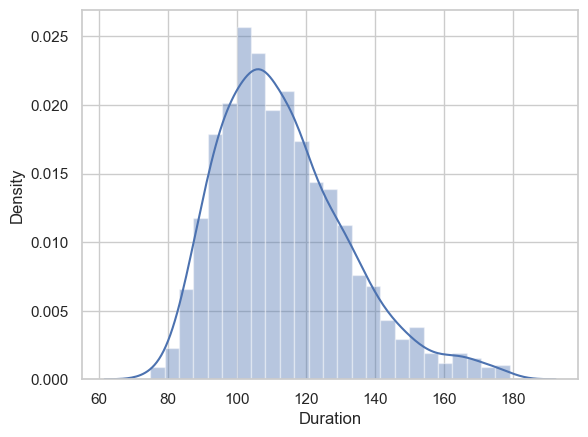

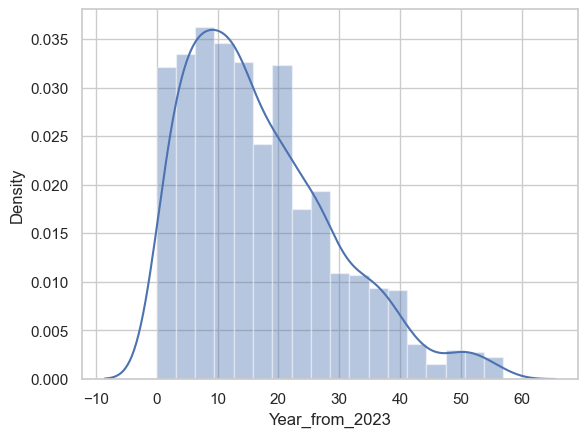

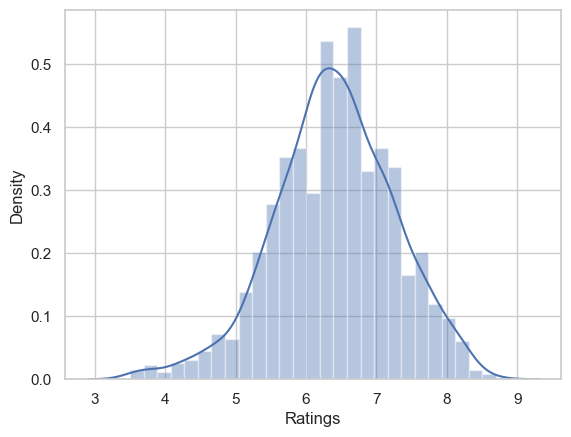

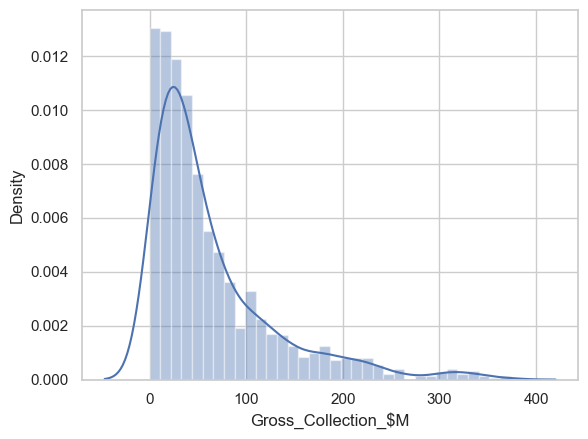

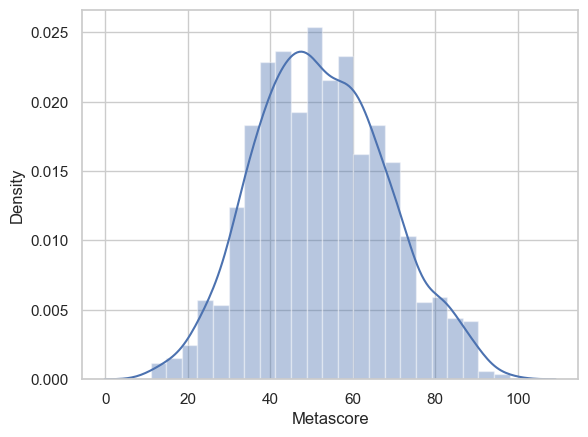

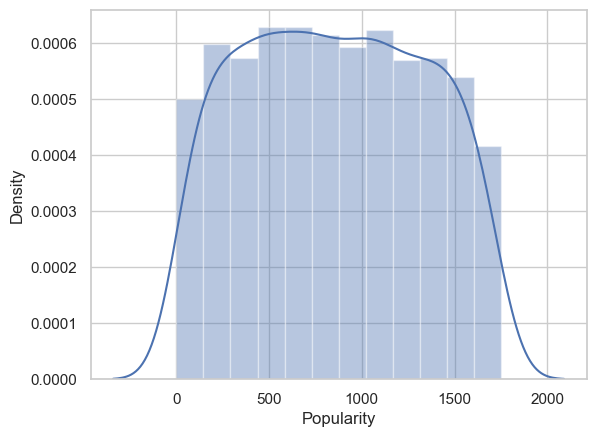

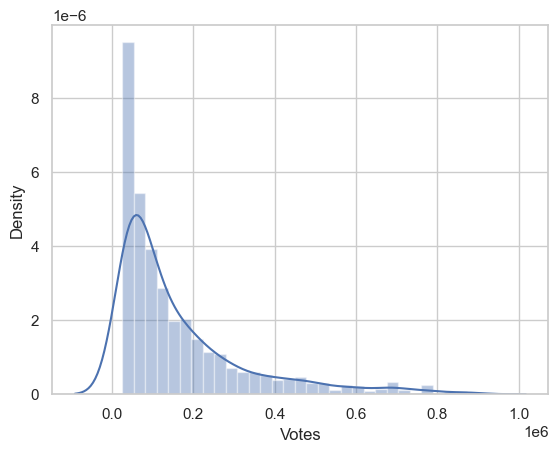

In [45]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(df_new[i])
    plt.show()

In [46]:
# Sort columns by datatypes
df_new.columns.to_series().groupby(df_new.dtypes).groups

{int32: ['Year_from_2023'], int64: ['Duration', 'Popularity', 'Votes'], float64: ['Ratings', 'Metascore', 'Gross_Collection_$M'], object: ['Movie Name', 'Director_1', 'Director_2', 'Director_3', 'Stars_1', 'Stars_2', 'Stars_3', 'Stars_4', 'Genre_1', 'Genre_2', 'Genre_3', 'Certification']}

In [47]:
# I'll consider -0.3/0.3 is ok among features skewness and treat the others features.
# suchas: Gangs of Wasseypur movie both parts originally shot as a single film measuring a total=321 minutes & screened @ 2012
# URL: https://en.wikipedia.org/wiki/Gangs_of_Wasseypur

skew_cols=['Votes','Gross_Collection_$M','Duration','Year_from_2023']

In [48]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
df_new[skew_cols] = scaler.fit_transform(df_new[skew_cols].values)

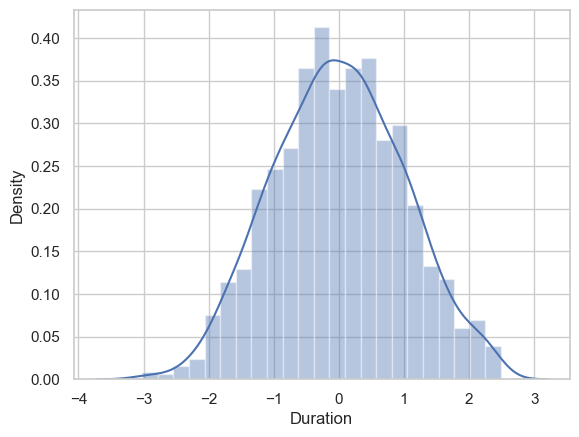

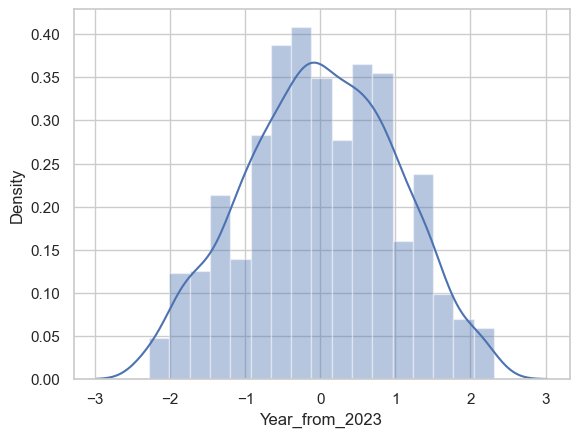

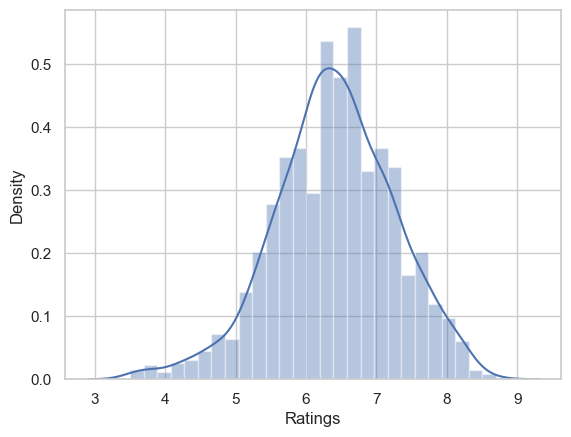

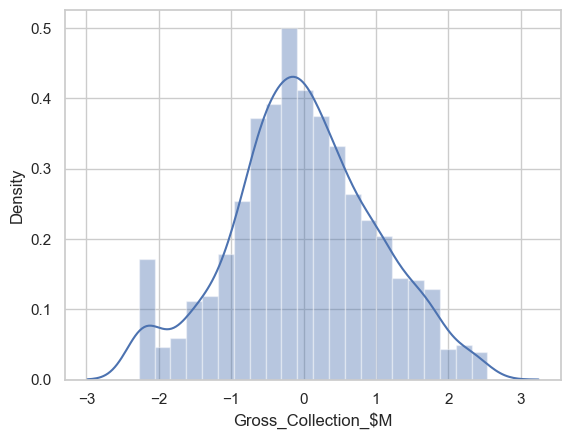

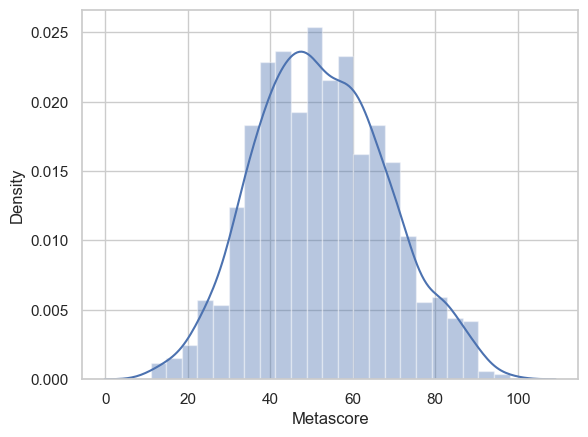

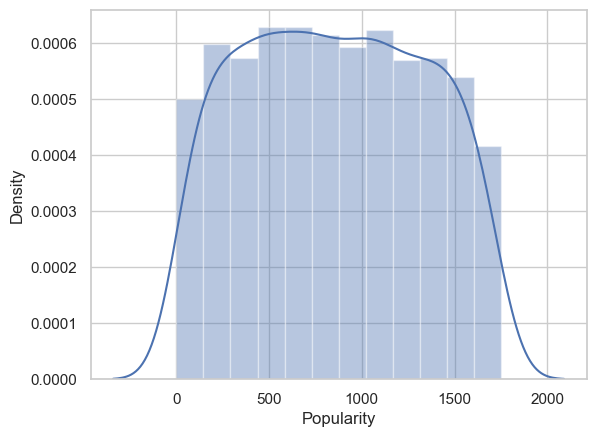

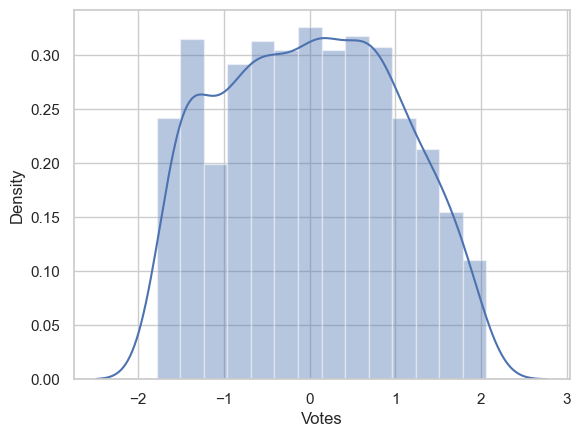

In [49]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(df_new[i])
    plt.show()

In [50]:
# Check Skewness
df_new.skew()

Duration               0.018988
Ratings               -0.256987
Metascore              0.171702
Popularity             0.032746
Votes                  0.053885
Gross_Collection_$M   -0.017004
Year_from_2023        -0.063838
dtype: float64

In [51]:
# drop unnecessary columns
df_new.drop(columns=['Movie Name'],axis=1,inplace=True)

### Encoding

In [52]:
# Use getdummies and frequency for large  for nominal features 
    
df_new=pd.get_dummies(df_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [53]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Stars_2','Stars_3', 'Stars_4','Director_2','Director_3']:
    frequency = df_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    df_new[i] = df_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
df_new

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_16,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_TV-14,Certification_TV-MA,Certification_U,Certification_UA
7,0.000722,0.946609,0.997114,1.794998,8.7,82.6,1612,0.000722,0.001443,0.000722,0.000722,0.193008,-1.092518,-1.416632,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,0.000722,0.946609,0.997114,2.087840,8.6,82.6,1272,0.000722,0.001443,0.001443,0.000722,-0.612317,-1.312212,-1.906165,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
12,0.000722,0.000722,0.000722,0.343192,8.4,87.0,27,0.000722,0.000722,0.001443,0.001443,1.689654,1.609910,-1.064353,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0.002165,0.946609,0.997114,1.240783,8.4,84.0,154,0.001443,0.000722,0.000722,0.000722,1.899538,0.678941,1.445615,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
16,0.001443,0.946609,0.997114,1.532664,8.4,89.0,1159,0.000722,0.000722,0.000722,0.000722,-1.268663,-1.312212,-1.229500,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,0.000722,0.946609,0.997114,-1.473502,3.7,24.0,1145,0.002165,0.003608,0.002165,0.001443,-0.824464,-0.773497,1.395388,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1464,0.000722,0.946609,0.997114,-0.226525,3.6,14.0,265,0.000722,0.001443,0.000722,0.000722,-1.305372,-0.793765,0.647558,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1465,0.000722,0.946609,0.997114,-1.062163,3.6,11.0,896,0.000722,0.000722,0.001443,0.000722,-0.688597,-0.139006,0.839000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1466,0.000722,0.946609,0.997114,-0.834784,3.5,40.0,1095,0.000722,0.000722,0.000722,0.000722,-1.511598,-1.561501,0.899866,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


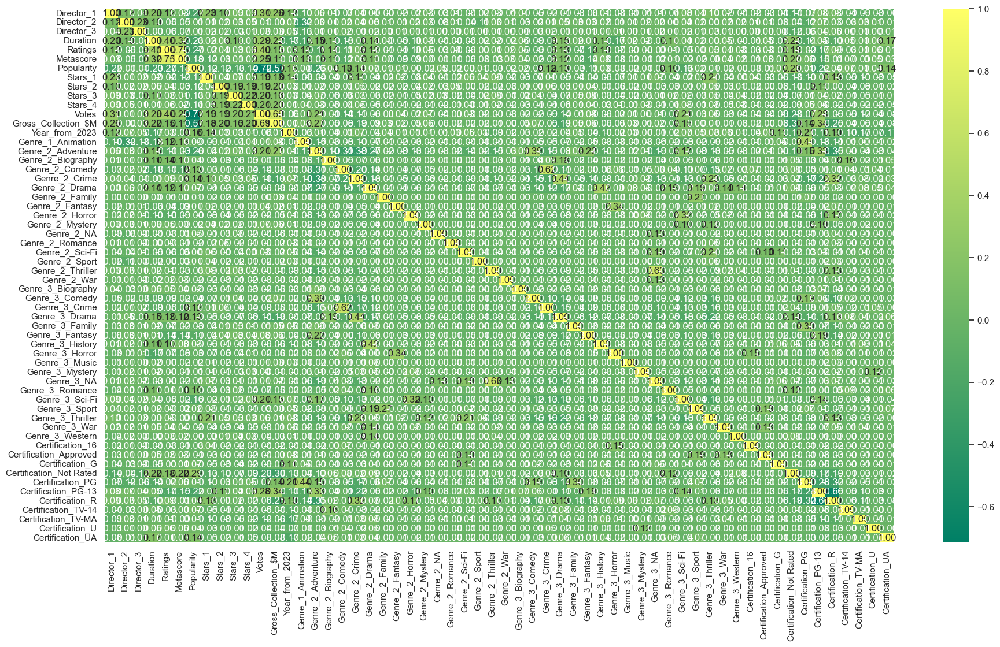

In [54]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(df_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

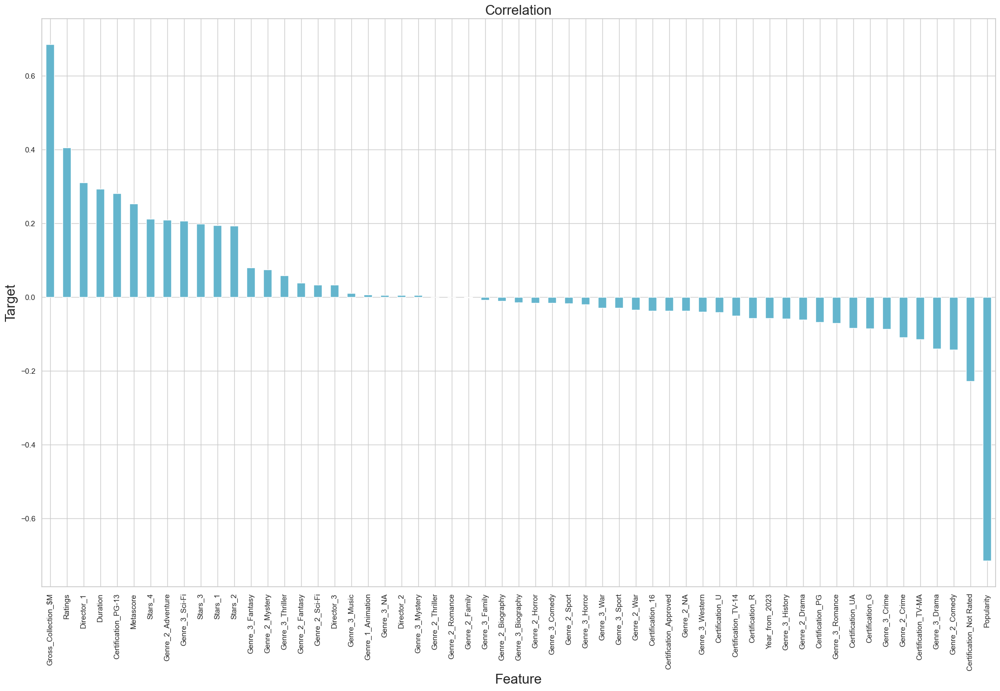

In [55]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

df_new.corr()['Votes'].sort_values(ascending = False).drop(['Votes']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()

Gross_Millions is strong postive correlation withe the target.

Mystery,Thirler , Romance and Family in Genre_2 is almost zero correlation.

Popularity is strong negative correlation with the target.

### DF_gross

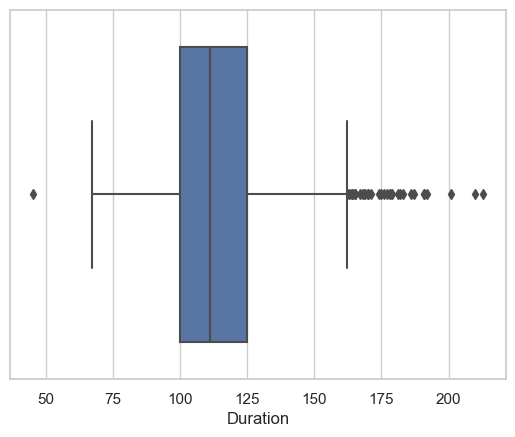

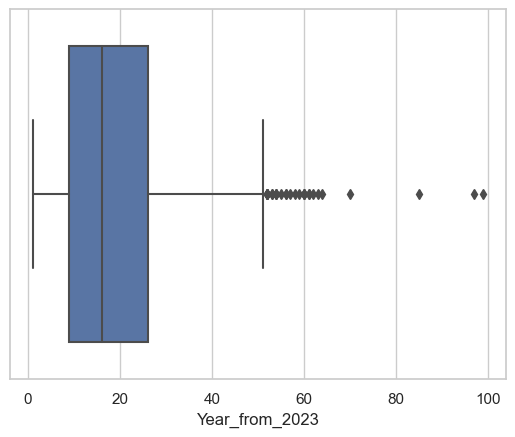

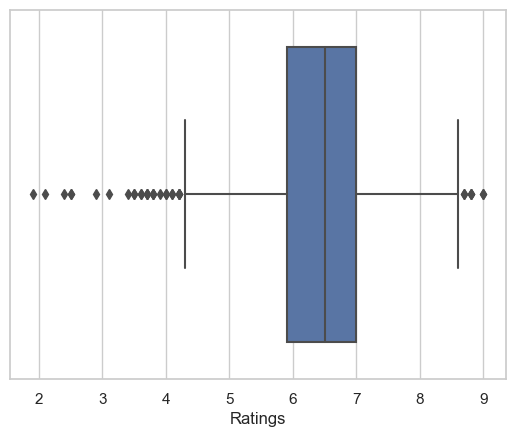

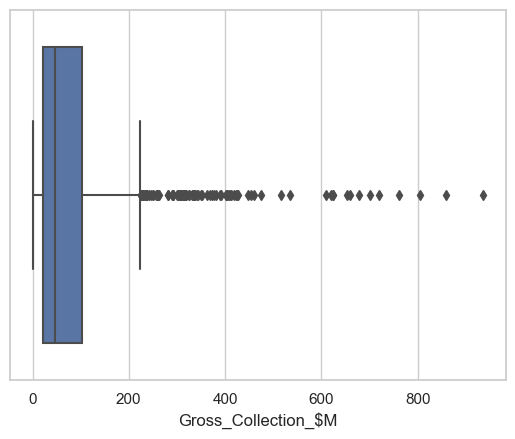

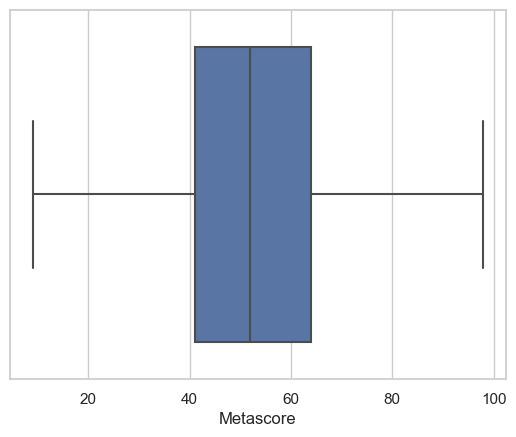

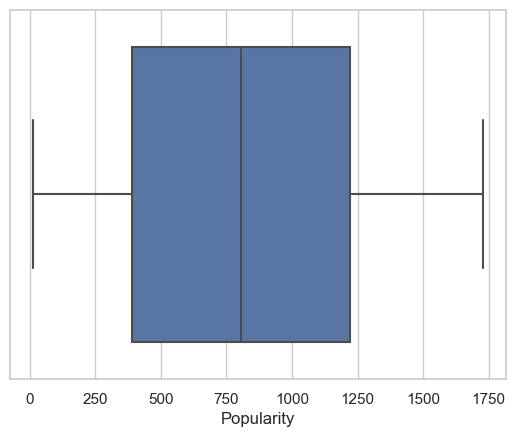

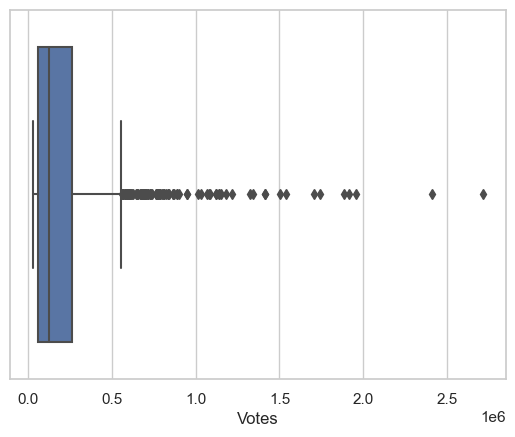

In [56]:
# Check outliers using boxplot
for col in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.boxplot(df_gross[col])
    plt.show()

In [57]:
# use Z-score method
outliers=df_gross[['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']]
z=np.abs(zscore(outliers))
dfgross_new=df_gross[(z<3).all(axis=1)]
dfgross_new

,Movie Name,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification,Year_from_2023
12,Spider-Man: Into the Spider-Verse,Bob Persich,Peter Ramsey,Rodney Rothman,117,8.4,87.0,27,Shameik Moore,Jake Johnson,Hailee Steinfeld,Mahershala Ali,566844,Animation,Action,Adventure,190.24,PG,5
15,Aliens,James Cameron,NA,NA,137,8.4,84.0,154,Sigourney Weaver,Michael Biehn,Carrie Henn,Paul Reiser,732615,Action,Adventure,Sci-Fi,85.16,R,37
18,Heat,Michael Mann,NA,NA,170,8.3,76.0,18,Al Pacino,Robert De Niro,Val Kilmer,Jon Voight,676362,Action,Crime,Drama,67.44,R,28
23,Dangal,Nitesh Tiwa,NA,NA,161,8.3,80.4,1045,Aamir Khan,Sakshi Tanwar,Fatima Sana Shaikh,Sanya Malhotra,197349,Action,Biography,Drama,12.39,Not Rated,7
24,K.G.F: Chapter 2,Prashanth Neel,NA,NA,168,8.3,82.6,1427,Yash,Sanjay Dutt,Raveena Tandon,Srinidhi Shetty,139647,Action,Crime,Drama,6.60,Not Rated,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,In the Name of the King: A Dungeon Siege Tale,Uwe Boll,NA,NA,127,3.8,15.0,1295,Jason Statham,Ron Perlman,Ray Liotta,Leelee Sobieski,50115,Action,Adventure,Fantasy,4.54,PG-13,16
1460,The Adventures of Pluto Nash,Ron Underwood,NA,NA,95,3.8,12.0,1611,Eddie Murphy,Jay Mohr,Randy Quaid,Rosario Dawson,26458,Action,Comedy,Sci-Fi,4.42,PG-13,21
1461,Batman & Robin,Joel Schumach,NA,NA,125,3.7,28.0,321,Arnold Schwarzenegger,George Clooney,Chris O'Donnell,Uma Thurman,259632,Action,Sci-Fi,NA,107.33,PG-13,26
1462,The Adventures of Sharkboy and Lavagirl 3-D,Robert Rodriguez,NA,NA,93,3.7,38.0,757,Cayden Boyd,George Lopez,Kristin Davis,David Arquette,39948,Action,Adventure,Comedy,39.18,PG,18


In [58]:
# data loss percentage

loss_percentage= ((df_gross.shape[0]- dfgross_new.shape[0])/df_gross.shape[0])*100
loss_percentage

6.713505074160812

It's acceptable.

In [59]:
# Check Skewness
dfgross_new.skew()

Duration               0.644461
Ratings               -0.287731
Metascore              0.167597
Popularity             0.042343
Votes                  1.737683
Gross_Collection_$M    1.786947
Year_from_2023         0.820590
dtype: float64

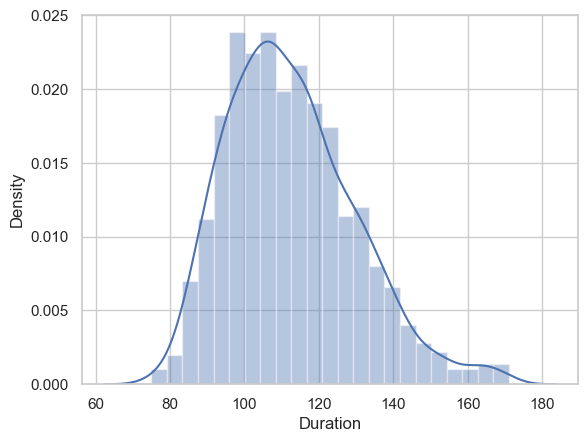

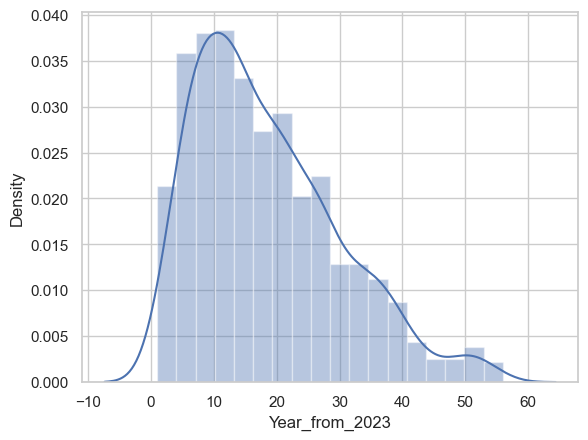

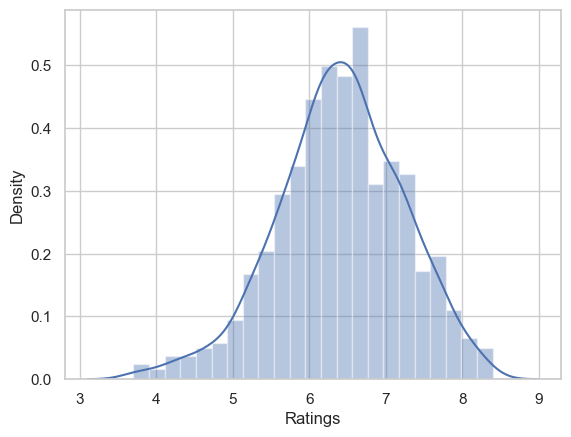

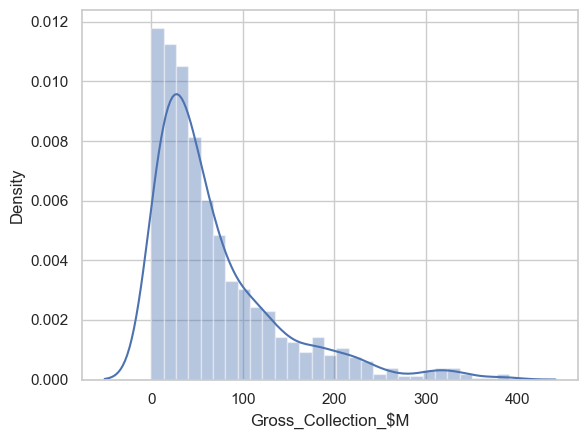

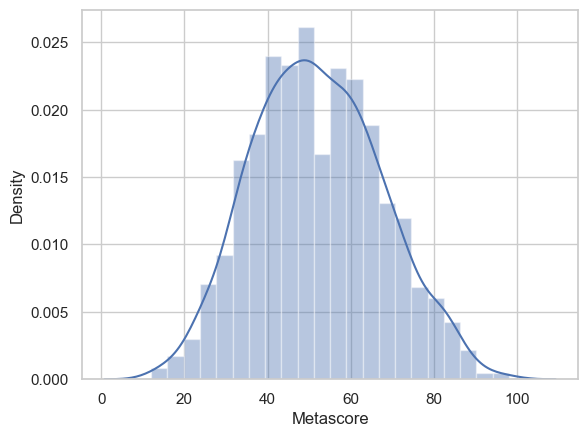

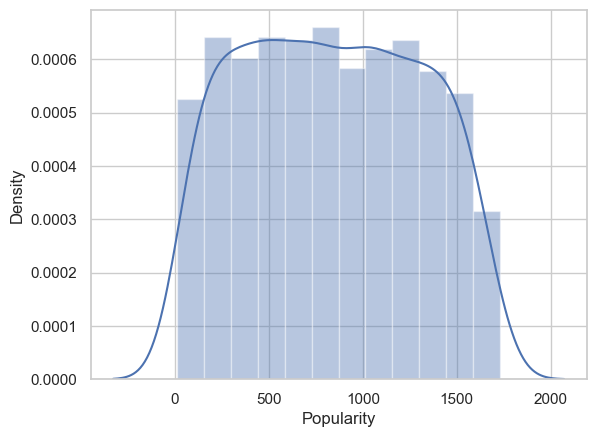

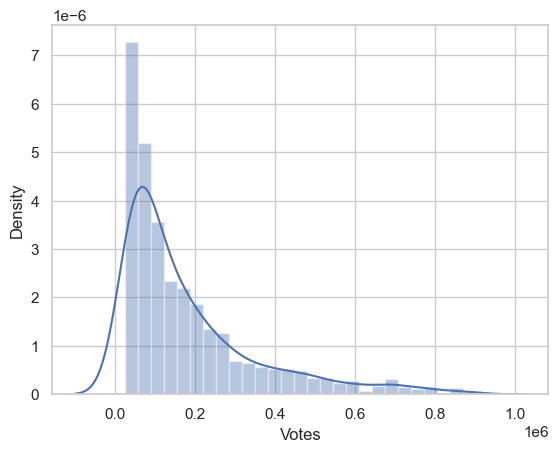

In [60]:
# Check Normality now
for i in ['Duration', 'Year_from_2023', 'Ratings','Gross_Collection_$M','Metascore', 'Popularity','Votes']:
    sns.distplot(dfgross_new[i])
    plt.show()

In [61]:
# I'll consider -0.7/0.7 is ok among features skewness and treat the others features.
skew_cols=['Votes','Gross_Collection_$M','Duration','Year_from_2023']

In [62]:
# withing Power transformer to treat skewness
scaler = PowerTransformer()
dfgross_new[skew_cols] = scaler.fit_transform(dfgross_new[skew_cols].values)

In [63]:
# drop unnecessary columns
dfgross_new.drop(columns=['Movie Name'],axis=1,inplace=True)

### Encoding

In [64]:
# Use getdummies for nominal features 
    
dfgross_new=pd.get_dummies(dfgross_new,columns=['Genre_1','Genre_2','Genre_3','Certification'],drop_first=True)

In [65]:
# Calculate the frequency of each category

for i in ['Director_1','Stars_1', 'Year_from_2023','Stars_2','Stars_3','Stars_4','Director_2','Director_3']:
    frequency = dfgross_new[i].value_counts(normalize=True)
    # Create a new column with the frequency encoding
    dfgross_new[i] = dfgross_new[i].map(frequency)

# Display the DataFrame with the frequency encoded columns
dfgross_new

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R
12,0.000837,0.000837,0.000837,0.380560,8.4,87.0,27,0.000837,0.000837,0.001674,0.001674,0.0,1.504708,0.033473,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
15,0.002510,0.948954,0.997490,1.354912,8.4,84.0,154,0.001674,0.000837,0.000837,0.000837,0.0,0.565653,0.011715,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
18,0.005858,0.948954,0.997490,2.538372,8.3,76.0,18,0.001674,0.000837,0.001674,0.001674,0.0,0.329465,0.022594,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
23,0.000837,0.948954,0.997490,2.255281,8.3,80.4,1045,0.001674,0.000837,0.000837,0.000837,0.0,-0.987601,0.044351,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
24,0.000837,0.948954,0.997490,2.477615,8.3,82.6,1427,0.000837,0.000837,0.000837,0.000837,0.0,-1.326768,0.012552,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,0.000837,0.948954,0.997490,0.899128,3.8,15.0,1295,0.012552,0.002510,0.001674,0.000837,0.0,-1.495054,0.026778,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1460,0.001674,0.948954,0.997490,-1.064384,3.8,12.0,1611,0.007531,0.000837,0.001674,0.001674,0.0,-1.506196,0.026778,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1461,0.003347,0.948954,0.997490,0.800859,3.7,28.0,321,0.020084,0.001674,0.000837,0.000837,0.0,0.815302,0.026778,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
1462,0.007531,0.948954,0.997490,-1.222987,3.7,38.0,757,0.000837,0.000837,0.000837,0.000837,0.0,-0.164572,0.027615,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


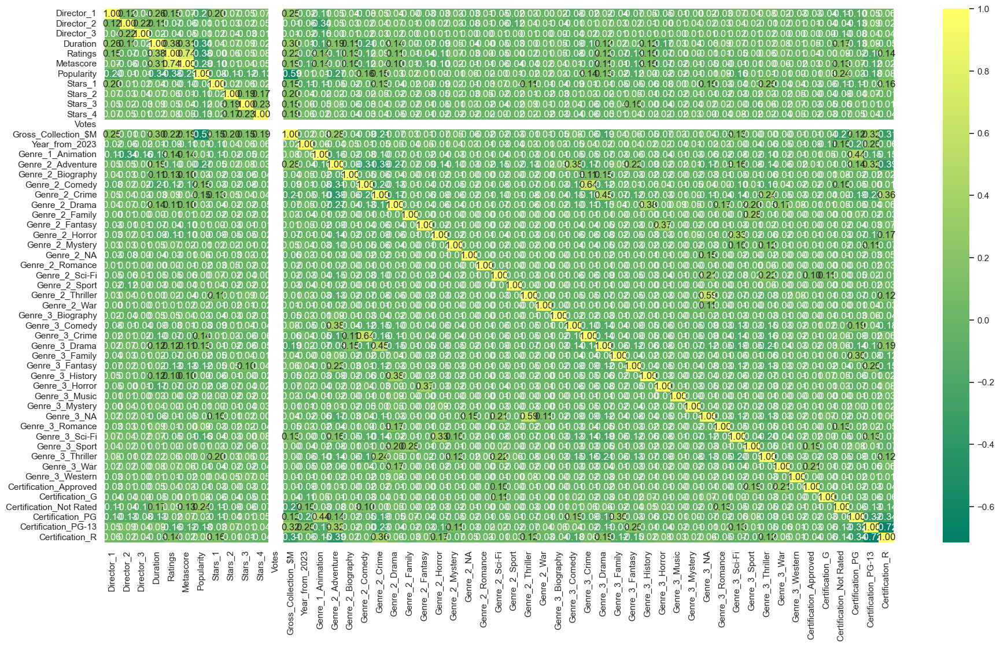

In [66]:
# heatmap correlation
plt.figure(figsize = (22,12))
sns.heatmap(dfgross_new.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

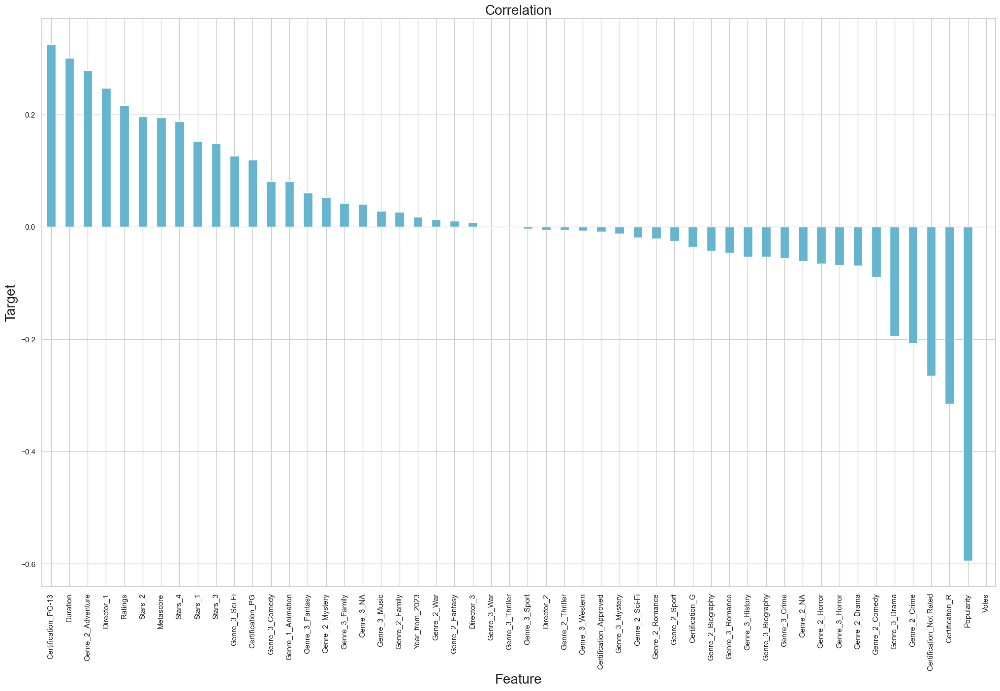

In [67]:
#Visualization of the Correlation Metrics for using Votes as target feature
plt.figure(figsize = (25, 15))

dfgross_new.corr()['Gross_Collection_$M'].sort_values(ascending = False).drop(['Gross_Collection_$M']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('Target', fontsize = 20)

plt.title('Correlation', fontsize = 20)

plt.show()

Votes is strong postive correlation withe the target.

war , sport Thriller in Genre_3 Genre_2_Thriller is the least correlation with the target.

Popularity is strong negative correlation with the target.

### Regression Problem (Votes)

In [68]:
# Votes is the target feature now.
x = df_new.drop('Votes',axis=1)
y = df_new['Votes']

### Standarization

In [69]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Gross_Collection_$M,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_16,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R,Certification_TV-14,Certification_TV-MA,Certification_U,Certification_UA
0,-0.783216,0.237492,0.053799,1.794998,2.684442,1.910897,1.565668,-0.851289,-0.073173,-0.649703,-0.547359,-1.092518,-1.416632,-0.193456,-0.753574,-0.132745,-0.40584,-0.502028,2.818144,-0.02687,-0.104599,-0.174595,-0.117894,-0.038014,-0.02687,-0.187352,-0.02687,-0.195454,-0.038014,-0.071247,-0.309277,-0.329848,-0.465679,-0.124035,-0.268190,-0.158581,-0.178935,-0.02687,-0.158581,3.389172,-0.117894,-0.391252,-0.101015,-0.472547,-0.104599,-0.071247,-0.02687,-0.038014,-0.065938,-0.221822,-0.370132,-0.768944,-0.852072,-0.065938,7.533260,-0.038014,-0.093454
1,-0.783216,0.237492,0.053799,2.087840,2.567489,1.910897,0.862269,-0.851289,-0.073173,0.274823,-0.547359,-1.312212,-1.906165,-0.193456,-0.753574,-0.132745,-0.40584,-0.502028,2.818144,-0.02687,-0.104599,-0.174595,-0.117894,-0.038014,-0.02687,-0.187352,-0.02687,-0.195454,-0.038014,-0.071247,-0.309277,-0.329848,-0.465679,-0.124035,-0.268190,-0.158581,-0.178935,-0.02687,6.305926,-0.295057,-0.117894,-0.391252,-0.101015,-0.472547,-0.104599,-0.071247,-0.02687,-0.038014,-0.065938,-0.221822,-0.370132,-0.768944,-0.852072,-0.065938,-0.132745,26.305893,-0.093454
2,-0.783216,-4.212594,-18.587630,0.343192,2.333582,2.190068,-1.713411,-0.851289,-0.715053,0.274823,0.649234,1.609910,-1.064353,5.169139,-0.753574,-0.132745,-0.40584,-0.502028,-0.354843,-0.02687,-0.104599,-0.174595,-0.117894,-0.038014,-0.02687,-0.187352,-0.02687,-0.195454,-0.038014,-0.071247,-0.309277,-0.329848,-0.465679,-0.124035,-0.268190,-0.158581,-0.178935,-0.02687,-0.158581,-0.295057,-0.117894,-0.391252,-0.101015,-0.472547,-0.104599,-0.071247,-0.02687,-0.038014,-0.065938,-0.221822,2.701740,-0.768944,-0.852072,-0.065938,-0.132745,-0.038014,-0.093454
3,-0.121303,0.237492,0.053799,1.240783,2.333582,1.999724,-1.450671,-0.695549,-0.715053,-0.649703,-0.547359,0.678941,1.445615,-0.193456,1.327010,-0.132745,-0.40584,-0.502028,-0.354843,-0.02687,-0.104599,-0.174595,-0.117894,-0.038014,-0.02687,-0.187352,-0.02687,-0.195454,-0.038014,-0.071247,-0.309277,-0.329848,-0.465679,-0.124035,-0.268190,-0.158581,-0.178935,-0.02687,-0.158581,-0.295057,-0.117894,2.555897,-0.101015,-0.472547,-0.104599,-0.071247,-0.02687,-0.038014,-0.065938,-0.221822,-0.370132,-0.768944,1.173609,-0.065938,-0.132745,-0.038014,-0.093454
4,-0.452260,0.237492,0.053799,1.532664,2.333582,2.316963,0.628493,-0.851289,-0.715053,-0.649703,-0.547359,-1.312212,-1.229500,-0.193456,1.327010,-0.132745,-0.40584,-0.502028,-0.354843,-0.02687,-0.104599,-0.174595,-0.117894,-0.038014,-0.02687,-0.187352,-0.02687,-0.195454,-0.038014,-0.071247,-0.309277,3.031695,-0.465679,-0.124035,-0.268190,-0.158581,-0.178935,-0.02687,-0.158581,-0.295057,-0.117894,-0.391252,-0.101015,-0.472547,-0.104599,-0.071247,-0.02687,-0.038014,-0.065938,4.508112,-0.370132,-0.768944,-0.852072,-0.065938,-0.132745,-0.038014,-0.093454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1381,-0.783216,0.237492,0.053799,-1.473502,-3.163226,-1.807147,0.599529,-0.539809,1.852470,1.199349,0.649234,-0.773497,1.395388,-0.193456,1

# Feature Reduction

### F-Regression

In [70]:
from sklearn.feature_selection import f_regression
F_values, p_values  = f_regression(x, y )

In [71]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [72]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [73]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,147.944785,0.000
17,Genre_2_Crime,16.790840,0.000
16,Genre_2_Comedy,28.889069,0.000
41,Genre_3_Sci-Fi,61.582218,0.000
14,Genre_2_Adventure,63.654533,0.000
49,Certification_Not Rated,75.942257,0.000
11,Gross_Collection_$M,1224.257087,0.000
10,Stars_4,64.792706,0.000
32,Genre_3_Drama,28.009590,0.000
9,Stars_3,56.361935,0.000


In [74]:
l1_fr=f_reg_results['Variable'][:-1].values  # CI=0.90
l1_fr

array(['Director_1', 'Genre_2_Crime', 'Genre_2_Comedy', 'Genre_3_Sci-Fi',
       'Genre_2_Adventure', 'Certification_Not Rated',
       'Gross_Collection_$M', 'Stars_4', 'Genre_3_Drama', 'Stars_3',
       'Stars_1', 'Popularity', 'Metascore', 'Ratings', 'Duration',
       'Certification_PG-13', 'Certification_TV-MA', 'Stars_2',
       'Certification_G', 'Genre_3_Crime', 'Certification_UA',
       'Genre_3_Fantasy', 'Genre_2_Mystery', 'Genre_3_Romance'],
      dtype=object)

### RFE

In [75]:
rfe = RFE(RandomForestRegressor(), n_features_to_select=17).fit(x,y)

In [76]:
l2_rfe = x.columns[rfe.get_support()]

In [77]:
l2_rfe

Index(['Director_1', 'Duration', 'Ratings', 'Metascore', 'Popularity', 'Stars_1', 'Stars_2',
       'Stars_3', 'Stars_4', 'Gross_Collection_$M', 'Year_from_2023', 'Genre_2_Adventure',
       'Genre_2_Crime', 'Genre_2_Drama', 'Genre_3_Thriller', 'Certification_PG',
       'Certification_PG-13'],
      dtype='object')

### SKB

In [78]:
SKB = SelectKBest(f_classif, k=17).fit(x, y )

In [79]:
l3_skb = x.columns[SKB.get_support()]

In [80]:
l3_skb

Index(['Genre_3_History', 'Genre_3_Music', 'Genre_3_Romance', 'Genre_3_Sci-Fi', 'Genre_3_Sport',
       'Genre_3_Thriller', 'Genre_3_War', 'Genre_3_Western', 'Certification_16',
       'Certification_Approved', 'Certification_G', 'Certification_Not Rated',
       'Certification_PG-13', 'Certification_TV-14', 'Certification_TV-MA', 'Certification_U',
       'Certification_UA'],
      dtype='object')

In [81]:
list(set(list(l1_fr)+list(l2_rfe)+list(l3_skb)))

['Certification_U',
 'Genre_3_Sci-Fi',
 'Duration',
 'Certification_TV-14',
 'Ratings',
 'Genre_3_Thriller',
 'Director_1',
 'Genre_2_Comedy',
 'Certification_Approved',
 'Popularity',
 'Genre_3_Crime',
 'Genre_3_Sport',
 'Genre_2_Drama',
 'Genre_2_Mystery',
 'Metascore',
 'Stars_3',
 'Genre_2_Adventure',
 'Genre_3_Fantasy',
 'Certification_UA',
 'Certification_PG',
 'Certification_TV-MA',
 'Certification_Not Rated',
 'Gross_Collection_$M',
 'Stars_4',
 'Year_from_2023',
 'Certification_16',
 'Stars_1',
 'Genre_3_Drama',
 'Certification_PG-13',
 'Genre_3_Romance',
 'Certification_G',
 'Genre_3_War',
 'Genre_2_Crime',
 'Genre_3_Music',
 'Stars_2',
 'Genre_3_History',
 'Genre_3_Western']

In [82]:
final_list= ['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Certification_G',
 'Genre_2_Mystery',
 'Certification_TV-14',
 'Genre_3_Western',
 'Genre_2_Drama',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 #'Certification_R',
 'Genre_3_Fantasy',
 'Certification_U',
 'Genre_3_History',
 'Gross_Collection_$M',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_16',
 'Certification_TV-MA',
 'Genre_3_Thriller',
 'Certification_PG',
 'Genre_3_Music',
 'Stars_2',
 'Certification_UA',
 'Genre_3_War',
 'Genre_3_Romance',
 'Genre_3_Crime',
 'Genre_3_Sport',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

### VIF check Multicollinarity

In [83]:
x = x[final_list]
y = y

In [84]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [85]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
20,2.891181,Ratings
12,2.536634,Metascore
34,2.460967,Genre_2_Adventure
21,2.384205,Genre_2_Comedy
3,2.383922,Genre_2_Crime
35,2.120049,Popularity
18,2.063461,Gross_Collection_$M
9,2.061587,Genre_2_Drama
33,2.019531,Genre_3_Drama
31,1.987979,Genre_3_Crime


Observations:

There are now no Multicollinarity between the final features as Independent feature VIF is within permissible limit of 10

# ML Alogs

In [86]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7842695510032662 seen for random state: 10


#### Split the data

In [87]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

### Linear Regression

In [88]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.719142250464188
R2_Score_test:  0.7842695510032662
RMSE =  0.4757
The mean absolute error =  0.3814998577162663


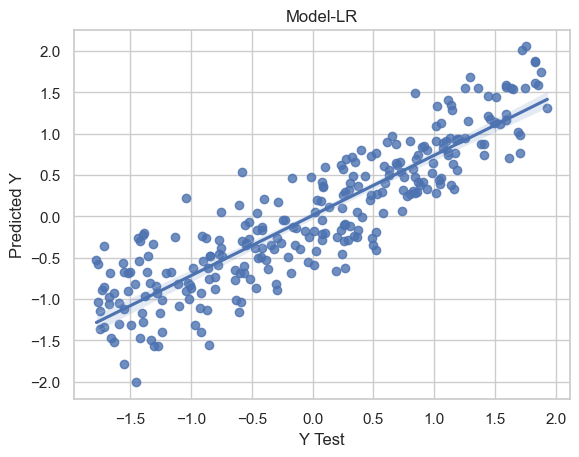

In [89]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Cross Validation

In [90]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is 56.507047238239515 and the cv score std is 0.08385474143178645,testing accuracy score= 78.42695510032662


At Cross fold 3 the cv score mean is 56.328373990788606 and the cv score std is 0.12855955227669538,testing accuracy score= 78.42695510032662


At Cross fold 4 the cv score mean is 57.73815641109944 and the cv score std is 0.12768916872340133,testing accuracy score= 78.42695510032662


At Cross fold 5 the cv score mean is 58.469180026778986 and the cv score std is 0.11352464134388117,testing accuracy score= 78.42695510032662


At Cross fold 6 the cv score mean is 58.97215332388895 and the cv score std is 0.12480679248848107,testing accuracy score= 78.42695510032662


At Cross fold 7 the cv score mean is 58.849142758823014 and the cv score std is 0.13480153363687167,testing accuracy score= 78.42695510032662


At Cross fold 8 the cv score mean is 58.85183313045701 and the cv score std is 0.1422273883176994,testing accuracy score= 78.4269551003266

### Polynomial with Regularization techniques

In [91]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

### Ridge

In [92]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.8895351879682597
R2_Score_test:  0.6995472943599123
RMSE =  0.5613
The mean absolute error =  0.4087239901717976


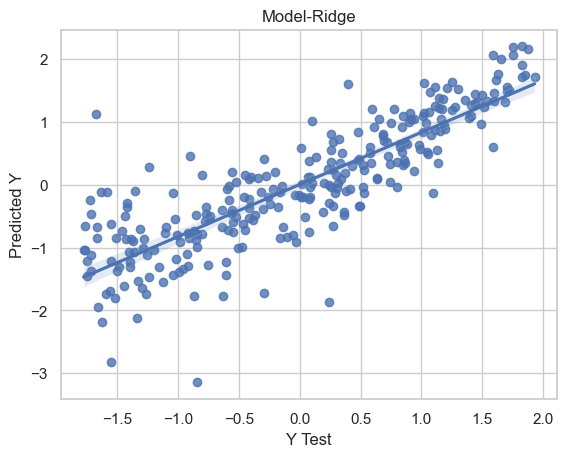

In [93]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Lasso regression

In [94]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.8895351879682597
R2_Score_test:  0.6995472943599123
RMSE =  1.0241
The mean absolute error =  0.8815429883160074


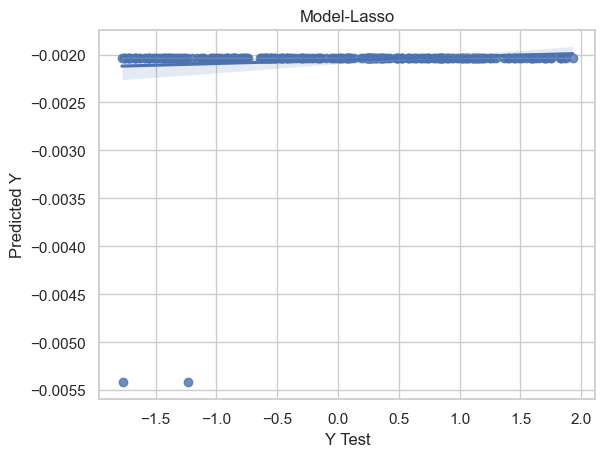

In [95]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### KNN

In [96]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6579234957288553 seen for random state: 35


In [97]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6979238014150646
The r2 score_test is: 0.7700010156180862
The mean absolute error 0.38925590563563894
The mean squared error 0.23779604517762634
The cross validation score 0.40081161955348155


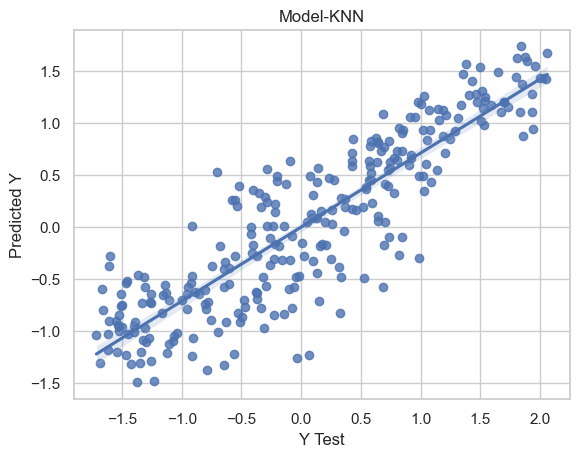

In [98]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### SVR

In [99]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8093310955282755 seen for random state: 81


In [100]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8367875945782783
The r2 score_test is: 0.8862797069195176
The mean absolute error 0.2696113228927282
The mean squared error 0.1352035019234723
The cross validation score 0.669683231270008


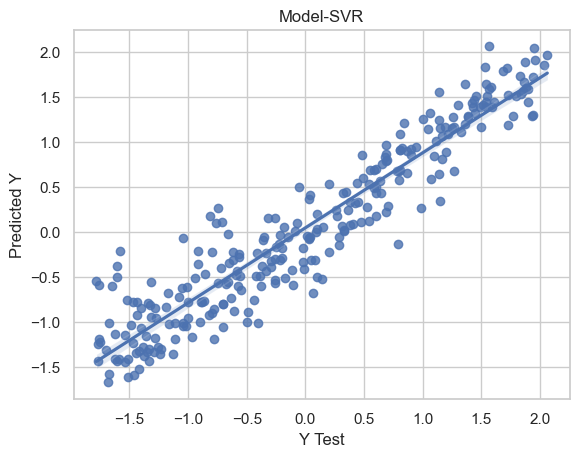

In [101]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Decision Tree Regressor

In [102]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.696647878270171 seen for random state: 23


In [103]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.9043481313978882
The r2 score_test is: 0.9584661865336257
The mean absolute error 0.0591977670876944
The mean squared error 0.04221399867278777
The cross validation score 0.37784864952249364


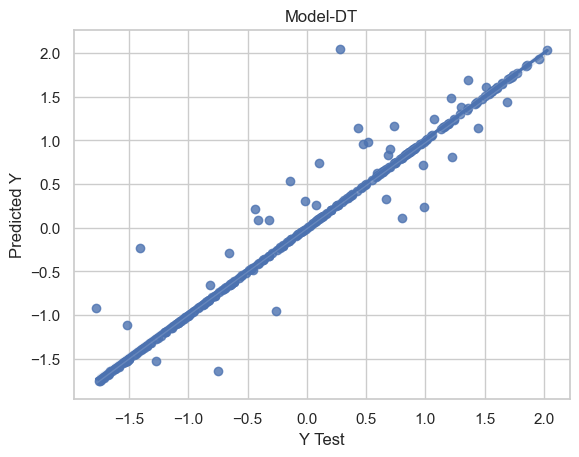

In [104]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

#### Ensembels Techniques

### Random Forest Regressor

In [105]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8469944690102205 seen for random state: 53


In [106]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.9344196670366319
The r2 score_test is: 0.9495318729090306
The mean absolute error 0.15673179137675256
The mean squared error 0.050609930698772586
The cross validation score 0.6916072152054128


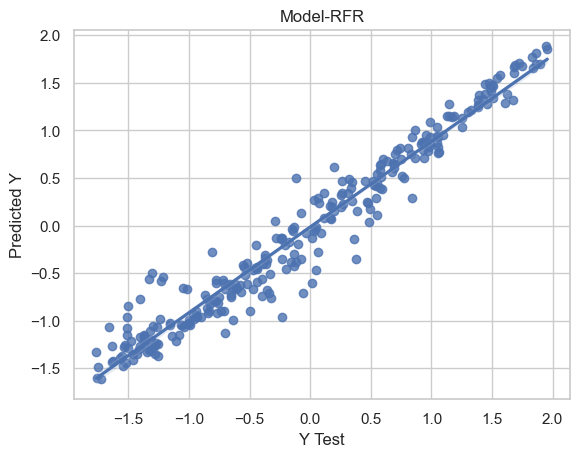

In [107]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### GB Regressor

In [108]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8454139892712262 seen for random state: 60


In [109]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8749967501098821
The r2 score_test is: 0.9100253446916722
The mean absolute error 0.2436953724662311
The mean squared error 0.09791484276102884
The cross validation score 0.7085833270780417


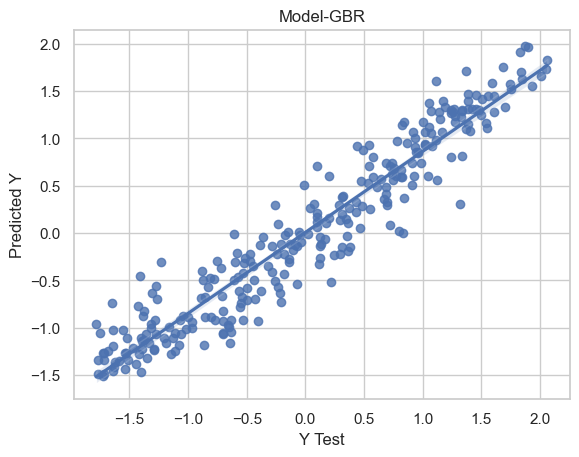

In [110]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### ADABRegressor

In [111]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.7630021240084017 seen for random state: 60


In [112]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.7603614579609805
The r2 score_test is: 0.7978058611620664
The mean absolute error 0.3979501456230169
The mean squared error 0.2200376010741489
The cross validation score 0.6158143504918985


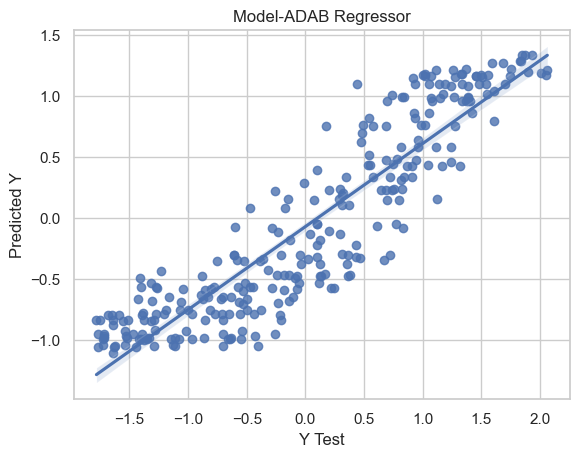

In [113]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### XGB Regressor

In [114]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.8437335315864589 seen for random state: 35


In [115]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.9587310264447699
The r2 score_test is: 0.9791011916917416
The mean absolute error 0.0707424607670981
The mean squared error 0.02160728656252254
The cross validation score 0.6860234622707724 0.09292155037256003


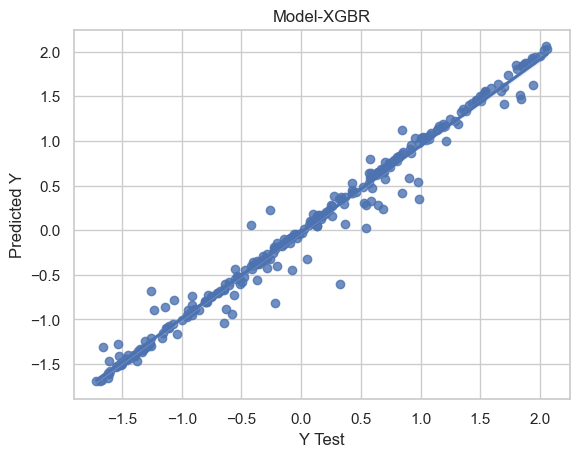

In [116]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [117]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 0.300332, 0.041293
ridge: 0.300209, 0.041052
lasso: 1.045734, 0.324663
svr: 0.252785, 0.052052
knn: 0.454589, 0.110860
dtr: 0.459105, 0.032008
rfr: 0.236012, 0.049594
gbr: 0.222832, 0.058274
adr: 0.302047, 0.075675
xgb: 0.240585, 0.072440


Best two for cross validation are XGB and RF regressors but XGB regressor is also better in r2 score so i will go with XGBR

### The best Algorithim is XGB Regressor


In [118]:
# Tunning Hyperparameters for XGB Regressor

# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700,1000],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1],
    'min_child_weight': [1,5,10]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 720 candidates, totalling 7200 fits
The r2 score is: 0.8686925006910217

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 0.8124547445457452

 The best parameters across ALL searched params:

In [119]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=53)

xgb_model = XGBRegressor(n_estimators= 1000,max_depth=5,colsample_bytree=0.8, learning_rate=0.01,min_child_weight=5
                         ,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.9545572971542213
The r2 score_test is:  0.8712241615543231
The mean absolute error  0.2794168778821033
root_mean_squared_error:  0.35935729903216107


In [120]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.7393646465758918


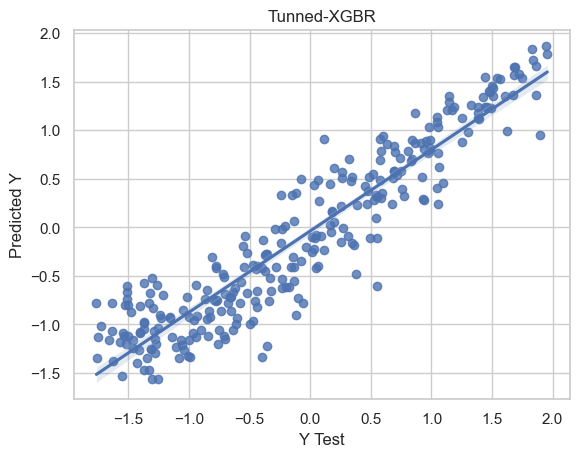

In [121]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Tunning the Parameters of the Model using OPTUNA {it's a new tunning method let's try it}

In [123]:
import optuna

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=53)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [124]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-23 23:16:06,002] A new study created in memory with name: no-name-01e81429-8010-4c40-9ea9-54648bd90a70
[I 2023-06-23 23:16:06,915] Trial 0 finished with value: 0.16820446045630036 and parameters: {'n_estimators': 100, 'learning_rate': 0.03248020420774937, 'max_depth': 4, 'subsample': 0.9366607116227043, 'colsample_bytree': 0.7716952574518934, 'gamma': 0.23309210644557898, 'lambda': 0.7866662999556286}. Best is trial 0 with value: 0.16820446045630036.
[I 2023-06-23 23:16:07,263] Trial 1 finished with value: 0.14393137367096157 and parameters: {'n_estimators': 100, 'learning_rate': 0.15283637922583534, 'max_depth': 4, 'subsample': 0.6605233524599823, 'colsample_bytree': 0.6959106771782513, 'gamma': 0.3278735740010612, 'lambda': 0.519548006482769}. Best is trial 1 with value: 0.14393137367096157.
[I 2023-06-23 23:16:07,638] Trial 2 finished with value: 0.14952515006867864 and parameters: {'n_estimators': 100, 'learning_rate': 0.12388536493760792, 'max_depth': 5, 'subsample': 0.

In [125]:
import optuna.visualization as vis
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [126]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8018673001841512, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.2895804555168841, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             lambda=0.4835686092646059, learning_rate=0.08018765305070763,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, ...)

#### In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.


#### On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org

In [127]:
pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  0.9601373657952083
The r2 score_test is:  0.968131796168539
The mean absolute error  0.13867635611479842
mean_squared_error:  0.03195774601457718
root_mean_squared_error:  0.1787672957075124


In [128]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.7285315476832849


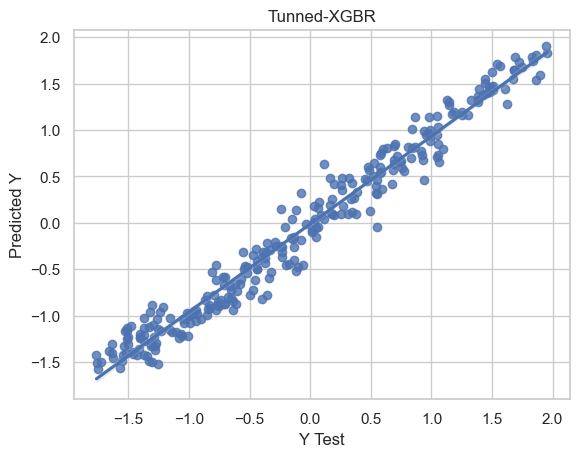

In [129]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Conclusion

After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 69% Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.



Evaluation Metrics & CV results:

   The r2 score_train is:  0.9601373657952083
   The r2 score_test is:  0.968131796168539
   The mean absolute error  0.13867635611479842
   mean_squared_error:  0.03195774601457718
   root_mean_squared_error:  0.1787672957075124
   Cross-validation score : 0.7285315476832849

### Saving the Model

In [139]:
#Saving the model using .pkl
import joblib
from joblib import dump
from joblib import load
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

joblib.dump(xgb,r'C:\Users\hp\Desktop\DataTrained\Capston Project\IMDB_XGB.pkl')

['C:\\Users\\hp\\Desktop\\DataTrained\\Capston Project\\IMDB_XGB.pkl']

In [151]:
# load model and get predictions

model_1=joblib.load(r'C:\Users\hp\Desktop\DataTrained\Capston Project\IMDB_XGB.pkl')

#Predict

#prediction_1 = model.predict(x_test)

In [152]:
pd.DataFrame([model_1.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277
Predicted,0.322226,0.341088,0.727827,0.048023,-0.609971,0.509579,-1.015746,-0.352814,-0.379903,-0.936453,-0.549062,1.255085,1.227818,0.032993,-0.168470,1.690121,-0.390921,0.706158,1.035482,-1.404655,-0.25019,-0.147303,-0.729637,0.862322,1.579397,-1.055057,0.182819,1.454355,0.786397,1.454958,-0.325564,0.542237,1.250978,0.675464,-0.125905,-0.843540,1.027731,-1.007918,-0.804671,-0.964519,-1.276054,0.779030,0.502586,1.248024,0.520298,-0.524922,1.540774,-0.743505,-0.753854,1.740268,0.529329,1.822599,-0.224409,0.263681,0.062970,-0.965189,-0.125252,-0.395071,1.591018,1.015463,0.149938,-1.109565,0.640348,-0.242165,0.285890,-0.758306,-0.751176,1.503093,0.631762,-0.706254,-0.549823,0.751511,-0.615287,1.390793,-0.756427,-0.890493,-0.518268,1.444816,-1.527779,-1.503128,-0.598643,-0.852732,1.743509,0.768299,0.575740,-0.043086,-1.435051,0.715032,-1.511994,1.052920,-0.182049,0.171701,-1.350683,1.556280,-0.253148,-1.099497,1.001370,-0.748146,0.784833,-1.465539,0.162349,1.455709,-1.482053,-0.573873,-1.018324,-0.427682,-0.340574,-1.215126,-0.371414,-1.324693,0.633850,1.051164,-1.310465,-0.362644,1.400847,-0.315175,1.436651,-1.562930,0.956334,0.368330,-1.148404,0.365371,0.115718,1.941259,-0.541590,1.951761,-1.554847,-0.683216,-0.191897,0.113941,0.547573,-0.438362,-1.744684,-0.274423,-0.734485,-1.282004,0.975535,0.894262,0.366484,0.176691,-1.726137,-1.780378,-1.556634,1.375494,0.583034,-1.293191,-0.942371,-1.248974,0.284147,1.512759,1.005658,-0.890576,-0.210679,-0.573327,-0.529918,0.648215,0.299912,0.981340,0.779454,0.467127,1.066777,-0.837639,1.493882,0.669411,-1.105078,-1.38743,1.023826,0.408028,-1.455522,-0.520398,-1.293404,1.463571,-1.625232,-1.042238,-0.135786,1.454003,-0.448316,-0.830895,-1.290161,0.554620,0.899215,-1.472949,-1.247859,0.488282,-1.495914,1.268141,1.137629,0.271396,-1.323097,1.046309,-0.921061,1.704427,-1.136430,1.336344,-0.995999,-1.238215,-1.355448,0.524642,0.832678,-1.373166,-0.693116,-0.450360,0.692159,-0.686193,0.188198,-1.624801,-0.554740,0.047454,-0.213622,0.346670,0.165523,-0.492489,-1.004985,-0.874450,-1.752077,1.533743,-0.927830,-1.278823,1.449415,-1.313227,1.137583,-1.332120,1.490695,0.546060,1.471162,1.882842,-1.643974,0.992436,0.023859,-1.438143,-1.343421,0.945463,-0.824268,-0.934090,-1.325997,-0.659218,-0.509680,0.541075,-1.321023,-1.402363,-0.134223,0.439786,-1.465668,0.922319,0.834496,-0.743689,-0.515158,-0.769358,-0.699191,0.234554,0.037271,0.541978,-1.000631,1.854671,-0.613528,0.34065,-0.452008,-0.621776,-0.438309,0.765078,-0.385205,-1.263673,-0.378303,0.070220,-0.028414,1.849782,-0.723973,-1.050727,-0.539361,-1.137721,1.489361,-0.664858,0.055986,0.866841,-0.527777,-0.843413,-1.078747,0.204681
Original,0.311921,0.345075,0.758915,0.011529,-0.607225,0.483717,-1.016428,-0.354396,-0.369015,-0.242026,-0.544995,1.250306,0.979100,0.037348,-0.136772,1.685903,-1.307153,0.686949,1.251371,-1.525097,-0.32299,-0.114757,-0.779087,0.804771,1.626176,-1.069637,0.199600,1.470745,0.745118,1.462009,0.047154,0.577056,1.187134,0.689399,-0.097960,

The Results are Excellent.

### Regression Problem (Gross_Collection)

In [153]:
# Votes is the target feature now.
x = dfgross_new.drop('Gross_Collection_$M',axis=1)
y = dfgross_new['Gross_Collection_$M']

### Standarization

In [154]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,Director_1,Director_2,Director_3,Duration,Ratings,Metascore,Popularity,Stars_1,Stars_2,Stars_3,Stars_4,Votes,Year_from_2023,Genre_1_Animation,Genre_2_Adventure,Genre_2_Biography,Genre_2_Comedy,Genre_2_Crime,Genre_2_Drama,Genre_2_Family,Genre_2_Fantasy,Genre_2_Horror,Genre_2_Mystery,Genre_2_NA,Genre_2_Romance,Genre_2_Sci-Fi,Genre_2_Sport,Genre_2_Thriller,Genre_2_War,Genre_3_Biography,Genre_3_Comedy,Genre_3_Crime,Genre_3_Drama,Genre_3_Family,Genre_3_Fantasy,Genre_3_History,Genre_3_Horror,Genre_3_Music,Genre_3_Mystery,Genre_3_NA,Genre_3_Romance,Genre_3_Sci-Fi,Genre_3_Sport,Genre_3_Thriller,Genre_3_War,Genre_3_Western,Certification_Approved,Certification_G,Certification_Not Rated,Certification_PG,Certification_PG-13,Certification_R
0,-0.823352,-4.313997,-19.933222,0.380560,2.427135,2.278570,-1.721154,-0.883250,-0.724605,0.283366,0.624134,0.0,0.477019,4.942219,-0.782742,-0.116494,-0.394596,-0.501307,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,-0.44294,-0.133744,-0.276725,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,-0.419739,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,-0.157707,2.543374,-0.823633,-0.868776
1,-0.148982,0.231931,0.050168,1.354912,2.427135,2.083752,-1.450160,-0.721713,-0.724605,-0.659873,-0.561621,0.0,-1.404055,-0.202338,1.277560,-0.116494,-0.394596,-0.501307,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,-0.44294,-0.133744,-0.276725,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,2.382431,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,-0.157707,-0.393179,-0.823633,1.151044
2,1.199757,0.231931,0.050168,2.538372,2.305667,1.564238,-1.740358,-0.721713,-0.724605,0.283366,0.624134,0.0,-0.463518,-0.202338,-0.782742,-0.116494,-0.394596,1.994785,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,2.25764,-0.133744,-0.276725,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,-0.419739,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,-0.157707,-0.393179,-0.823633,1.151044
3,-0.823352,0.231931,0.050168,2.255281,2.305667,1.849971,0.451060,-0.721713,-0.724605,-0.659873,-0.561621,0.0,1.417556,-0.202338,-0.782742,8.584142,-0.394596,-0.501307,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,2.25764,-0.133744,-0.276725,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,-0.419739,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,6.340891,-0.393179,-0.823633,-0.868776
4,-0.823352,0.231931,0.050168,2.477615,2.305667,1.992837,1.266173,-0.883250,-0.724605,-0.659873,-0.561621,0.0,-1.331706,-0.202338,-0.782742,-0.116494,-0.394596,1.994785,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,2.25764,-0.133744,-0.276725,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,-0.419739,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,6.340891,-0.393179,-0.823633,-0.868776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1190,-0.823352,0.231931,0.050168,0.899128,-3.160419,-2.397058,0.984511,1.378270,0.539487,0.283366,-0.561621,0.0,-0.101773,-0.202338,1.277560,-0.116494,-0.394596,-0.501307,-0.338731,-0.02894,-0.112747,-0.183676,-0.123665,-0.040944,-0.02894,-0.193200,-0.02894,-0.168521,-0.02894,-0.071037,-0.315208,-0.323166,-0.44294,-0.133744,3.613699,-0.143162,-0.181228,-0.02894,-0.157707,-0.274968,-0.108878,-0.419739,-0.104873,-0.482939,-0.096387,-0.057953,-0.040944,-0.071037,-0.157707,-0.393179,1.214133,-0.868776
1191,-0.486167,0.231931,0.050168,-1.06438

### Feature Reduction

#### F-Regression

In [155]:
F_values, p_values  = f_regression(x, y )

import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(x.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(25)

In [156]:
f_reg_results

,Variable,F_Value,P_Value
0,Director_1,77.691205,0.000
49,Certification_PG,17.100357,0.000
48,Certification_Not Rated,90.502190,0.000
41,Genre_3_Sci-Fi,19.369459,0.000
32,Genre_3_Drama,46.859975,0.000
50,Certification_PG-13,140.569874,0.000
17,Genre_2_Crime,53.506579,0.000
14,Genre_2_Adventure,100.013181,0.000
10,Stars_4,43.405734,0.000
51,Certification_R,131.411779,0.000


In [157]:
l1_fr=f_reg_results['Variable'][:-6].values  # CI=0.90
l1_fr

array(['Director_1', 'Certification_PG', 'Certification_Not Rated',
       'Genre_3_Sci-Fi', 'Genre_3_Drama', 'Certification_PG-13',
       'Genre_2_Crime', 'Genre_2_Adventure', 'Stars_4', 'Certification_R',
       'Stars_2', 'Duration', 'Ratings', 'Stars_3', 'Stars_1',
       'Metascore', 'Popularity', 'Genre_2_Comedy', 'Genre_3_Comedy'],
      dtype=object)

### RFE

In [158]:
rfe = RFE(RandomForestRegressor(), n_features_to_select=7).fit(x,y)

l2_rfe = x.columns[rfe.get_support()]

In [159]:
l2_rfe

Index(['Duration', 'Ratings', 'Metascore', 'Popularity', 'Stars_1', 'Year_from_2023',
       'Certification_R'],
      dtype='object')

### SKB

In [160]:
SKB = SelectKBest(f_classif, k=7).fit(x, y )

l3_skb = x.columns[SKB.get_support()]

In [161]:
l3_skb

Index(['Genre_3_Biography', 'Genre_3_Family', 'Genre_3_Music', 'Genre_3_War', 'Genre_3_Western',
       'Certification_Approved', 'Certification_G'],
      dtype='object')

In [162]:
list(set(list(l1_fr)+list(l2_rfe)+list(l3_skb)))

['Genre_3_Sci-Fi',
 'Duration',
 'Ratings',
 'Certification_R',
 'Director_1',
 'Genre_2_Comedy',
 'Certification_Approved',
 'Popularity',
 'Genre_3_Biography',
 'Metascore',
 'Stars_3',
 'Genre_2_Adventure',
 'Certification_PG',
 'Certification_Not Rated',
 'Genre_3_Comedy',
 'Stars_4',
 'Year_from_2023',
 'Stars_1',
 'Genre_3_Drama',
 'Certification_PG-13',
 'Genre_3_Family',
 'Certification_G',
 'Genre_3_War',
 'Genre_2_Crime',
 'Genre_3_Music',
 'Stars_2',
 'Genre_3_Western']

In [163]:
final_list= ['Director_1',
 'Certification_Not Rated',
 'Stars_1',
 'Genre_2_Crime',
 'Duration',
 'Genre_3_Western',
 'Genre_3_Sci-Fi',
 'Certification_PG-13',
 'Votes',
 'Metascore',
 'Stars_4',
 'Year_from_2023',
 #'Certification_R',
 'Certification_Approved',
 'Ratings',
 'Genre_2_Comedy',
 'Certification_PG',
 'Genre_2_War',
 'Genre_3_Biography',
 'Genre_3_Music',
 'Stars_2',
 'Genre_3_War',
 'Genre_3_Family',
 'Genre_3_Drama',
 'Genre_2_Adventure',
 'Popularity',
 'Stars_3']

### VIF check Multicollinarity

In [164]:
x = x[final_list]
y = y

In [165]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [166]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
13,2.813738,Ratings
9,2.370882,Metascore
3,1.858026,Genre_2_Crime
23,1.811682,Genre_2_Adventure
24,1.679350,Popularity
4,1.545086,Duration
7,1.522675,Certification_PG-13
15,1.516559,Certification_PG
22,1.430963,Genre_3_Drama
14,1.373593,Genre_2_Comedy


There are now no Multicollinarity between the final features as Independent feature VIF is within permissible limit of 10

# ML Algos

In [167]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    lr= LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6022292367982989 seen for random state: 73


### Split the data

In [168]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=max_RS)

### Linear Regression

In [169]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_train=r2_score(y_train,pred_train)
score_test=r2_score(y_test,pred_test)
mse = mean_squared_error(y_test, pred_test)

In [170]:
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test))

R2_Score_train:  0.5272739174124071
R2_Score_test:  0.6022292367982989
RMSE =  0.6229
The mean absolute error =  0.49562000043454135


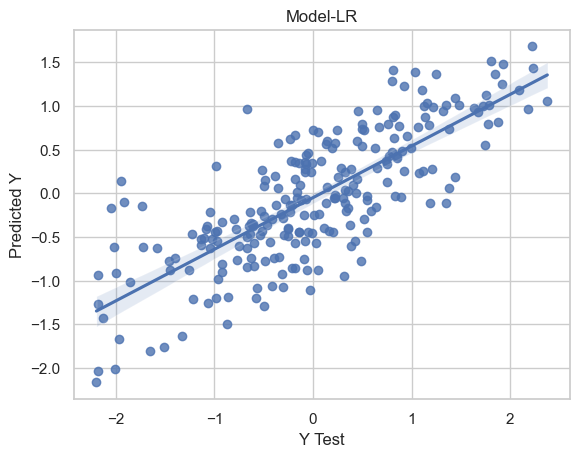

In [171]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-LR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Cross Validation

In [172]:
for i in range(2,11):
    cv_score=cross_val_score(lr,x,y,scoring='r2',cv=i)
    cv_mean= cv_score.mean()
    cv_std= cv_score.std()
    print(f'At Cross fold {i} the cv score mean is {cv_mean*100} and the cv score std is {cv_std},testing accuracy score= {score_test*100}')
    print('\n')

At Cross fold 2 the cv score mean is 43.50004314959297 and the cv score std is 0.10183296898724592,testing accuracy score= 60.22292367982989


At Cross fold 3 the cv score mean is 42.87267725937099 and the cv score std is 0.12880377187784817,testing accuracy score= 60.22292367982989


At Cross fold 4 the cv score mean is 44.049071179618196 and the cv score std is 0.148387791847131,testing accuracy score= 60.22292367982989


At Cross fold 5 the cv score mean is 45.525835513294396 and the cv score std is 0.10882791787168064,testing accuracy score= 60.22292367982989


At Cross fold 6 the cv score mean is 44.74208366965295 and the cv score std is 0.12633668722175412,testing accuracy score= 60.22292367982989


At Cross fold 7 the cv score mean is 44.42328320623762 and the cv score std is 0.14182717511216408,testing accuracy score= 60.22292367982989


At Cross fold 8 the cv score mean is 43.76919691359071 and the cv score std is 0.15080628478569758,testing accuracy score= 60.22292367982989



### Polynomial with Regularization techniques

In [173]:
# Define the degree of polynomial features
degree = 2

# Create an instance of PolynomialFeatures
poly_features = PolynomialFeatures(degree=degree)

# Fit and transform the training features to polynomial features
X_train_poly = poly_features.fit_transform(x_train)

# Transform the testing features to polynomial features
X_test_poly = poly_features.transform(x_test)

### Ridge

In [174]:
# Create an instance of Ridge regression
ridge_model = Ridge()

ridge_model.fit(X_train_poly, y_train)

pred_train_ridge=ridge_model.predict(X_train_poly)
pred_test_ridge = ridge_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_ridge)

# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_ridge))

R2_Score_train:  0.6722239969921869
R2_Score_test:  0.4056422067439803
RMSE =  0.7615
The mean absolute error =  0.5556652577026825


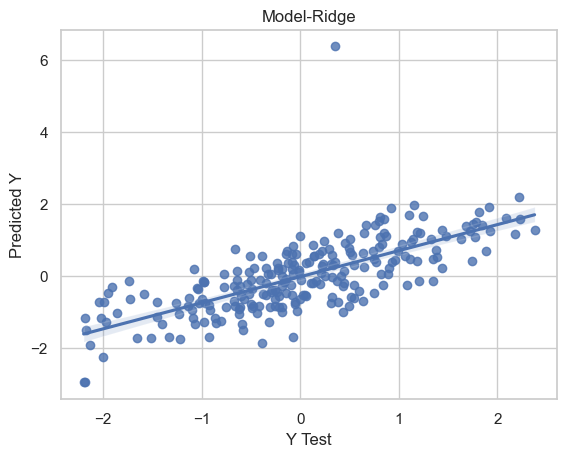

In [175]:
sns.regplot(x=y_test,y=pred_test_ridge)
plt.title("Model-Ridge")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Lasso

In [176]:
# Create an instance of Lasso regression
lasso_model = Lasso()


lasso_model.fit(X_train_poly, y_train)

pred_train_lasso=lasso_model.predict(X_train_poly)
pred_test_lasso = lasso_model.predict(X_test_poly)

score_train=r2_score(y_train,pred_train_ridge)
score_test=r2_score(y_test,pred_test_ridge)
mse = mean_squared_error(y_test, pred_test_lasso)


# Print the mean squared error
print('R2_Score_train: ',score_train)
print('R2_Score_test: ',score_test)
print('RMSE = ', np.sqrt(mse).round(4))
print('The mean absolute error = ', mean_absolute_error(y_test, pred_test_lasso))

R2_Score_train:  0.6722239969921869
R2_Score_test:  0.4056422067439803
RMSE =  0.9597
The mean absolute error =  0.7609177061183058


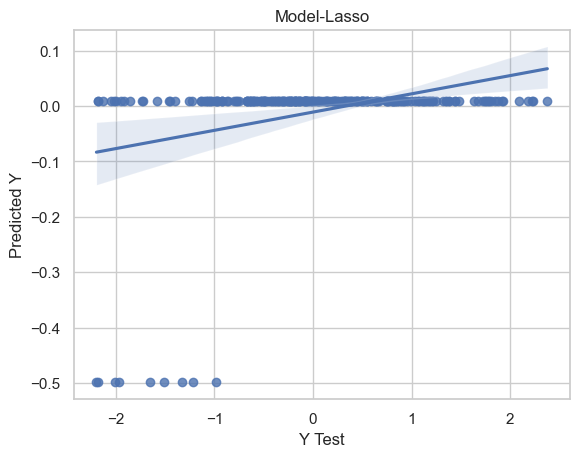

In [177]:
sns.regplot(x=y_test,y=pred_test_lasso)
plt.title("Model-Lasso")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### KNN

In [178]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    knn = KNeighborsRegressor()
    knn.fit(x_train,y_train)
    pred = knn.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.576401640479891 seen for random state: 11


In [179]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=knn.predict(x_train)
pred_test = knn.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(knn, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.5857874410536754
The r2 score_test is: 0.669941028816688
The mean absolute error 0.44734419413681126
The mean squared error 0.3377044002191723
The cross validation score 0.388717000126504


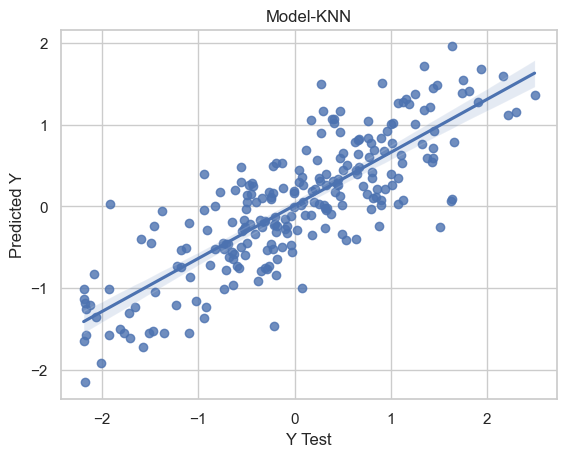

In [180]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-KNN")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### SVR

In [181]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    svr = SVR()
    svr.fit(x_train,y_train)
    pred = svr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6545927936162319 seen for random state: 86


In [182]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=svr.predict(x_train)
pred_test = svr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(svr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6439933620133383
The r2 score_test is: 0.7466845456622103
The mean absolute error 0.3638767613074332
The mean squared error 0.2503251005909477
The cross validation score 0.4908550803782322


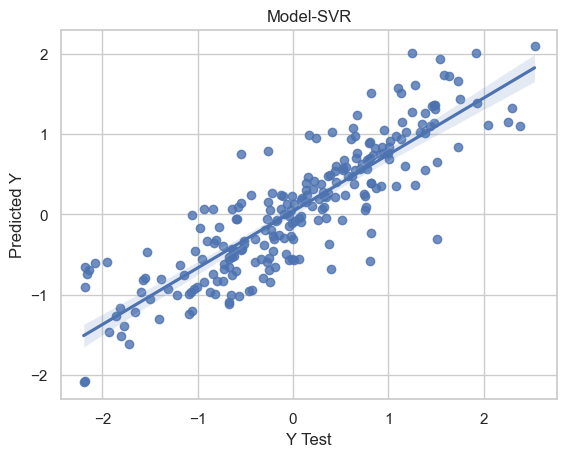

In [183]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-SVR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Decision Tree Regressor

In [184]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
  
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    pred = dtr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.3270365521435711 seen for random state: 5


In [185]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [186]:
pred_train=dtr.predict(x_train)
pred_test= dtr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(dtr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.7765187906369068
The r2 score_test is: 0.824377629674788
The mean absolute error 0.13549685994191654
The mean squared error 0.18424458881228103
The cross validation score -0.09346243303884659


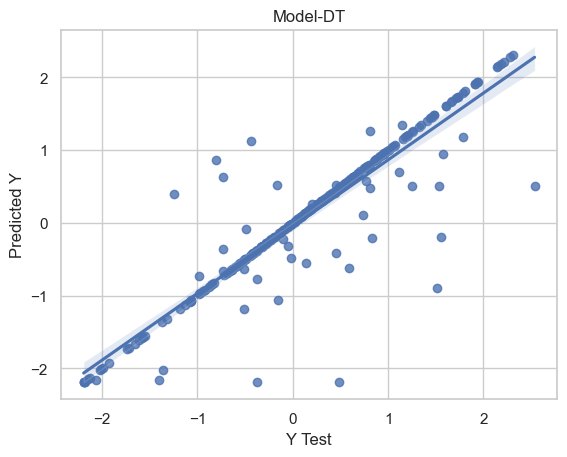

In [187]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-DT")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

# Ensembels Techniques

### Random Forest Regressor


In [188]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6638512028122844 seen for random state: 11


In [189]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

In [190]:
pred_train=rfr.predict(x_train)
pred_test= rfr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(rfr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.8526150082299
The r2 score_test is: 0.8893329522733386
The mean absolute error 0.23688585154162808
The mean squared error 0.11323052011757673
The cross validation score 0.47899146956607497


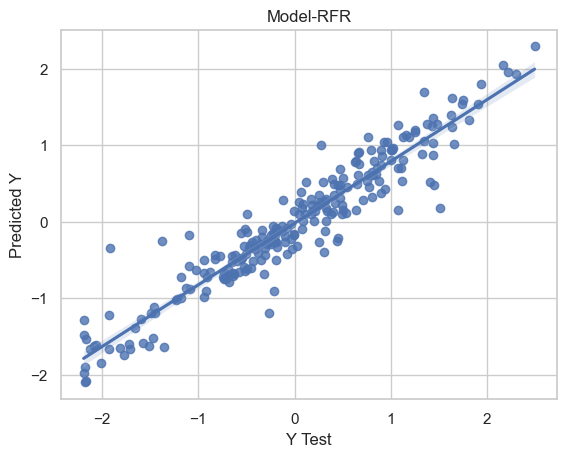

In [191]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-RFR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### GB Regressor

In [192]:
#Selecting the best random state to get maximum accuracy.

max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
   
    gbr=GradientBoostingRegressor()
    gbr.fit(x_train,y_train)
    pred=gbr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6402408726844804 seen for random state: 29


In [193]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=gbr.predict(x_train)
pred_test = gbr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(gbr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.6962487127505005
The r2 score_test is: 0.768088564998363
The mean absolute error 0.38395010999668233
The mean squared error 0.24342186519054487
The cross validation score 0.4815291911627935


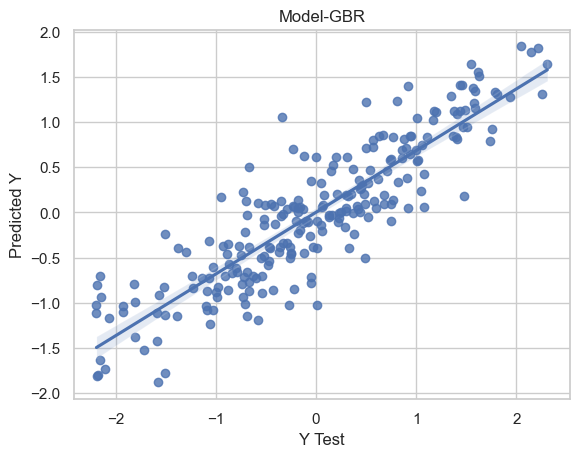

In [194]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-GBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### ADABRegressor

In [195]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    
    adr=AdaBoostRegressor()
    adr.fit(x_train,y_train)
    adr_pred=adr.predict(x_test)
    acc = r2_score(y_test, adr_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.6056129787699065 seen for random state: 29


In [196]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=adr.predict(x_train)
pred_test = adr.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(adr, x,y,cv=10)
print('The cross validation score', cv.mean())

The r2 score_train is: 0.5348985947500084
The r2 score_test is: 0.6246429017765376
The mean absolute error 0.5205081068603398
The mean squared error 0.3939871484190541
The cross validation score 0.4294280737431291


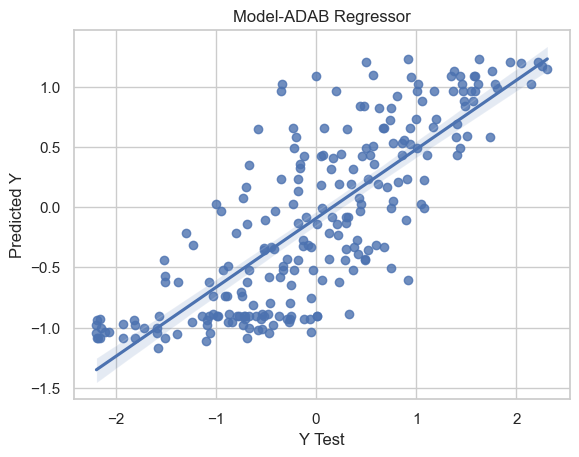

In [197]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-ADAB Regressor")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### XGB Regressor

In [198]:
#Selecting the best random state to get maximum accuracy.
max_acc=0
max_RS=0
for i in range(1,100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)

    xgb=XGBRegressor()
    xgb.fit(x_train,y_train)
    xgb_pred=xgb.predict(x_test)
    acc = r2_score(y_test, xgb_pred)
    if acc > max_acc:
        max_acc= acc
        max_RS=i
print("The max accuracy is",max_acc, 'seen for random state:',max_RS)

The max accuracy is 0.5955727424970725 seen for random state: 11


In [199]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=max_RS)

pred_train=xgb.predict(x_train)
pred_test= xgb.predict(x_test)
print('The r2 score_train is:', r2_score(y_train, pred_train))
print('The r2 score_test is:', r2_score(y_test, pred_test))
print('The mean absolute error', mean_absolute_error(y_test, pred_test))
print('The mean squared error', mean_squared_error(y_test, pred_test))
cv = cross_val_score(xgb, x,y,cv=10)
print('The cross validation score', cv.mean(),cv.std())

The r2 score_train is: 0.892362853449268
The r2 score_test is: 0.915450147266803
The mean absolute error 0.1381850950488713
The mean squared error 0.08650835092746394
The cross validation score 0.4021978950461159 0.1857031219548723


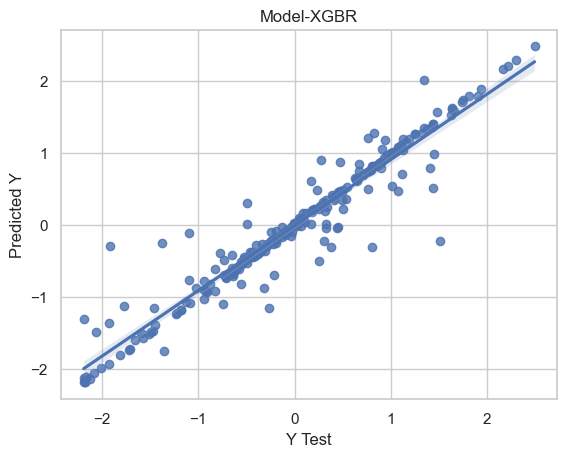

In [200]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Model-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [201]:
np.random.seed(10)

def rmse_cv(model, x, y):
    rmse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=10)
    return (rmse)

models = [LinearRegression(), Ridge(), Lasso(), SVR(), KNeighborsRegressor(),
          DecisionTreeRegressor(), RandomForestRegressor(), GradientBoostingRegressor(),
          AdaBoostRegressor(), XGBRegressor()]

names = ['lr', 'ridge', 'lasso', 'svr', 'knn', 'dtr', 'rfr', 'gbr', 'adr', 'xgb']

for model, name in zip(models, names):
    score = rmse_cv(model, x, y)
    print("{}: {:.6f}, {:.6f}".format(name, score.mean(), score.std()))

lr: 0.480019, 0.059374
ridge: 0.480091, 0.059471
lasso: 1.013730, 0.261289
svr: 0.452235, 0.060281
knn: 0.545183, 0.079715
dtr: 0.950440, 0.236671
rfr: 0.462022, 0.059350
gbr: 0.450068, 0.066595
adr: 0.509925, 0.075567
xgb: 0.522762, 0.066852


------------------------------------------------------------------------------------------------------------------
### The best Algorithim is XGB Regressor
------------------------------------------------------------------------------------------------------------------

### Tunning the Parameters of the Model using OPTUNA and GridSearchCV

In [202]:
# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(x, y, test_size=0.2, random_state=22)

# Define the objective function to optimize using Optuna
def objective(trial):
    # Define the hyperparameters to tune
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 1.0),
        'lambda': trial.suggest_float('lambda', 0.0, 1.0),
    }

    # Create the XGB regressor with the current hyperparameters
    model = XGBRegressor(**params)

    # Train the model
    model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], early_stopping_rounds=10, verbose=False)

    # Predict on the validation set
    y_pred = model.predict(X_valid)

    # Calculate the mean squared error as the objective to minimize
    mse = mean_squared_error(y_valid, y_pred)

    return mse

In [203]:
# Create an Optuna study object
study = optuna.create_study(direction='minimize')

# Optimize the objective function using Optuna
study.optimize(objective, n_trials=100)

# Get the best hyperparameters found by Optuna
best_params = study.best_params

[I 2023-06-24 00:40:21,917] A new study created in memory with name: no-name-a4e44116-8c99-4c97-a8f6-3d12ea659cc0
[I 2023-06-24 00:40:22,413] Trial 0 finished with value: 0.5184441498160556 and parameters: {'n_estimators': 100, 'learning_rate': 0.16724671146338868, 'max_depth': 10, 'subsample': 0.7121552686826409, 'colsample_bytree': 0.8717470090314678, 'gamma': 0.5158106499607782, 'lambda': 0.20675846321142377}. Best is trial 0 with value: 0.5184441498160556.
[I 2023-06-24 00:40:22,853] Trial 1 finished with value: 0.510735305668366 and parameters: {'n_estimators': 100, 'learning_rate': 0.18439390290502075, 'max_depth': 8, 'subsample': 0.9808841073714182, 'colsample_bytree': 0.8905030449752882, 'gamma': 0.15759264651927474, 'lambda': 0.5039600282163672}. Best is trial 1 with value: 0.510735305668366.
[I 2023-06-24 00:40:23,191] Trial 2 finished with value: 0.4858605093400464 and parameters: {'n_estimators': 100, 'learning_rate': 0.1496372233467892, 'max_depth': 8, 'subsample': 0.75488

In [204]:
# Visualize the optimization history
vis.plot_optimization_history(study).show()

# Visualize the importance of hyperparameters
vis.plot_param_importances(study).show()

# Visualize the slice of hyperparameters
vis.plot_slice(study).show()

In [205]:
# Train the final model using the best hyperparameters
final_model = XGBRegressor(**best_params)
final_model.fit(x, y)

pred_train=final_model.predict(x_train)
pred_test= final_model.predict(X_valid)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_valid, pred_test))
print('The mean absolute error ', mean_absolute_error(y_valid, pred_test))
print('mean_squared_error: ',mean_squared_error(y_valid,pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_valid,pred_test)))

The r2 score_train is:  -0.7183208539495722
The r2 score_test is:  0.8471467292631103
The mean absolute error  0.31655145857373346
mean_squared_error:  0.15917801317965732
root_mean_squared_error:  0.39897119342085


In [206]:
# Calculate the cross-validation score with the final model
cv_scores = cross_val_score(final_model, x, y, cv=10)

# Optuna maximizes the objective function, so negate the mean squared error
avg_mse = cv_scores.mean()

print("Cross-validation score :", avg_mse)

Cross-validation score : 0.47863198181201055


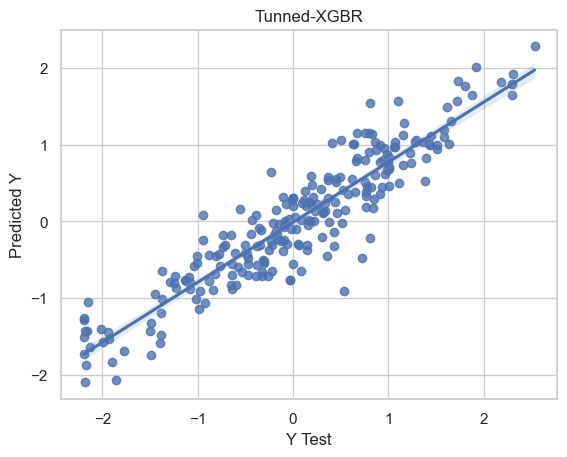

In [207]:
sns.regplot(x=y_valid,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### GridSearchCV

In [208]:
# Define the parameter grid
params = {
    'n_estimators': [100, 200,500,700],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3,5,7,9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8,1]
}

xgb_tuned= GridSearchCV(XGBRegressor(),params,scoring='r2',cv =10,n_jobs=-1,verbose=True)
xgb_tuned.fit(x_train,y_train)
y_pred=xgb_tuned.predict(x_test)
print('The r2 score is:', r2_score(y_test, y_pred))
print("\n The best estimator across ALL searched params:\n", xgb_tuned.best_estimator_)
print("\n The best score across ALL searched params:\n", xgb_tuned.best_score_)
print("\n The best parameters across ALL searched params:\n",xgb_tuned.best_params_)

Fitting 10 folds for each of 192 candidates, totalling 1920 fits
The r2 score is: -0.04699083936551629

 The best estimator across ALL searched params:
 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=200, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

 The best score across ALL searched params:
 -0.027708426598391723

 The best parameters across ALL searched 

In [209]:
# Reinstating with tuned parameters
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=22)

xgb_model=XGBRegressor(n_estimators=100,max_depth=3,colsample_bytree=1,learning_rate=0.1,subsample=0.8).fit(x_train,y_train)

pred_train=xgb_model.predict(x_train)
pred_test= xgb_model.predict(x_test)
print('The r2 score_train is: ', r2_score(y_train, pred_train))
print('The r2 score_test is: ', r2_score(y_test, pred_test))
print('The mean absolute error ', mean_absolute_error(y_test, pred_test))
print('root_mean_squared_error: ',np.sqrt(mean_squared_error(y_test,pred_test)))

The r2 score_train is:  0.7438337422902161
The r2 score_test is:  0.5731275231774224
The mean absolute error  0.5281597838538493
root_mean_squared_error:  0.6667349921621603


In [210]:
cv = cross_val_score(xgb_model, x,y,cv=10)
print('The cross validation score', cv.mean())

The cross validation score 0.48720329475865765


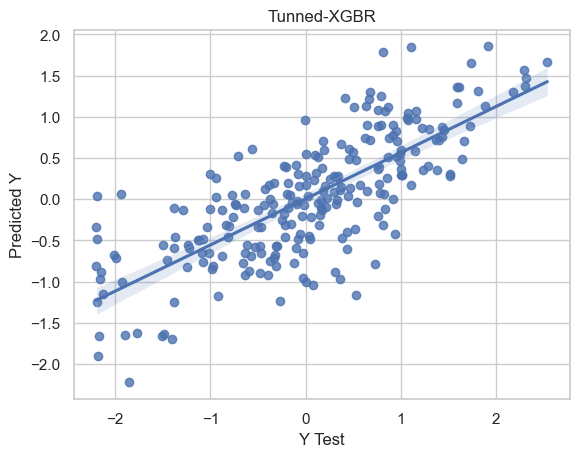

In [211]:
sns.regplot(x=y_test,y=pred_test)
plt.title("Tunned-XGBR")
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

### Conclusion:

After using two different techniques of tunning the parameters of XGB regressor Algorithm. {GridSearchCV & OPTUNA}

The OPTUNA one was better than GridSearch in all the evaluation metrics also in the cross validation performance, But the orginal XGB Model before tunning is the best one in all the evaluation metrics but not in the CV as it score almost 53% Therefor i will go with the Orginal XGB regressor Model to be my Final used Model.

Evaluation Metrics & CV results:

The r2 score_train is:  0.7438337422902161
The r2 score_test is:  0.5731275231774224
The mean absolute error  0.5281597838538493
root_mean_squared_error:  0.6667349921621603

The cross validation score 0.48720329475865765



### Saving the Model

In [213]:
#Saving the model using .pkl
joblib.dump(xgb,r'C:\Users\hp\Desktop\DataTrained\Capston Project\IMDB_Gross_XGB.pkl')

['C:\\Users\\hp\\Desktop\\DataTrained\\Capston Project\\IMDB_Gross_XGB.pkl']

In [214]:
# load model and get predictions

model=joblib.load(r'C:\Users\hp\Desktop\DataTrained\Capston Project\IMDB_Gross_XGB.pkl')

In [215]:
#Predict

prediction= model.predict(x_test)

pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238
Predicted,-1.300045,1.376007,-0.471336,0.899708,0.304979,1.013248,-1.060996,-2.174242,0.526876,0.943239,-0.684491,0.137421,-0.774896,1.720369,1.926866,0.202757,-0.055719,-0.565466,0.388286,0.989869,0.999667,1.254737,0.020925,-2.099198,-0.201831,1.109972,0.775435,-0.311433,0.835952,0.320859,-1.216978,0.210208,0.015571,0.031562,-2.139141,0.150272,-0.188796,-1.868942,1.282128,0.843328,1.085914,0.428520,-0.117037,-0.962748,-0.112798,0.629996,-0.281678,0.143473,0.226363,0.754328,-0.509414,-1.140866,0.034935,1.634879,0.609294,0.334719,-2.104950,-0.51732,0.116529,1.679497,-1.005934,-0.809997,-0.040337,-0.194307,-1.364581,-0.047883,-0.998806,0.200039,-0.94312,-0.645776,0.177612,-0.486706,-2.170160,-0.670437,2.010806,-2.123248,0.026914,0.721786,1.004719,-0.055288,0.751139,-0.377735,-0.906152,0.335070,-0.672616,0.380948,-0.694338,0.460976,-0.548195,-0.393617,-1.929473,-0.309755,1.279655,-0.210617,1.611549,-1.377669,-1.485758,-1.389888,-2.154112,0.013388,0.679080,-1.87989,-1.391617,0.725938,-0.523701,0.909862,-1.501234,-0.171094,-0.369414,0.001961,1.154738,-0.482840,0.420784,1.214201,-0.858384,0.631628,0.748683,0.874316,0.390876,-1.127856,-0.132347,-1.437684,-0.723333,2.280535,1.171177,0.118867,-0.013056,0.534275,0.833636,-0.023909,-0.031013,0.003831,1.539707,0.564630,0.910240,-1.125195,1.006318,0.370887,-2.164987,-0.607118,0.881834,0.873302,1.662892,0.876926,-0.350538,0.823350,0.863957,-0.020465,0.293818,-0.115524,-1.987921,-2.190603,0.011261,0.568895,-0.309580,0.201775,-0.400465,-0.359681,0.943503,1.365010,0.301351,1.402488,1.812131,2.135486,-0.843673,-0.603074,-1.157048,0.477051,0.167662,0.745552,-0.679913,0.484317,1.607269,1.161153,1.362143,1.881099,-0.593736,0.097955,-0.477516,0.477240,1.058615,-1.947248,-0.792903,-0.779852,-0.093069,-0.225951,-0.241867,0.518983,-0.428667,1.477888,1.051655,0.024606,1.170616,0.318229,0.449386,0.752337,0.295988,-0.077906,-0.710704,-0.097424,-1.086058,-0.425067,0.332008,-0.378464,-0.622325,-1.296549,-2.133428,0.151657,-0.842904,2.272732,-0.956576,-0.924995,0.222965,0.822257,0.643319,-0.729968,-0.990458,1.058022,0.031784,-0.609180,0.783395,0.378546,0.658247,-0.493456,-0.470534,1.161424,-1.091497,-0.535060,0.278514,0.343690,0.166271,-0.337716,0.939562,-1.848285,2.290540,0.008507,-1.984054,-0.365237,-0.901838
Original,-1.375020,1.382489,-0.101382,0.794518,0.332369,0.991431,-1.083252,-2.190582,0.543265,1.108812,-0.655003,0.151367,-0.820197,1.733964,1.915992,0.195992,-0.026326,-1.234679,0.441466,1.451857,1.001225,1.292106,-0.009773,-2.187402,-0.201469,1.102249,0.793782,-0.307103,1.511256,0.381229,-1.230156,0.215925,0.030571,0.079365,-2.128092,0.824198,-0.208366,-1.900404,0.828832,0.671430,1.583448,0.463003,-0.104852,-1.040219,0.835706,0.807502,-0.229306,0.098401,0.255830,0.770458,-0.560587,-0.976115,-0.000360,1.657331,0.647262,0.334977,-2.159752,-0.16931,0.131929,2.536114,-1.076283,-0.765333,-0.068814,-0.181239,-1.384427,-0.063866,-0.372994,0.174280,0.42895,-0.635601,0.185667,-0.326984,-2.184244,-0.600439,0.807711,-1.398767,-0.181893,0.754994,1.004629,-0.078973,0.753915,-0.375579,-0.876765,0.358939,-1.015996,0.369988,-0.712366,0.456126,-0.473524,-0.777892,-1.931424,-0.337184,1

The results are very good.